<a href="https://colab.research.google.com/github/Iddhie/MSc-Data-Science-Research/blob/main/DatasetAnalysisMScThesis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Blockchain Wallet Segmentation of a Decentralized Exchange (UniSwap) Based on Trading Behaviour on the Ethereum Blockchain**

### **This Jupyter notebook loads the concatanated dataset which consists of the full transaction history of the wallet addresses which carried out a swap on the UniSwap DEX platform and transforms it into an aggregated dataset per wallet address by extracting features from the transactions dataset. The dataset consists of 2539 unique wallets.**
.


### **Then, It proceeds with the Preliminary Data Analysis and Correlation Analysis, followed by the application of preparing the data to be utilized for machine learning models**
.


### **This consists of classical machine learning techniques like K-Means, Agglomerative, DBSCAN and Gaussian Mixture Models clustering.** **These models are optimized to fit the most effective amount of clusters for the highest perfrmance using techniques such as the Elbow Method. The performance of these models are compared up against eachother to identify the highest performing model.**
.

### **Finally, this Jupyter Notebook carries out Deep Learning-Based Clustering utilizing techniques such as Autoencoders, Variational Autoencoders, Deep Embedded Clustering and Deep InfoMax**




*Wallet addresses obtained from: UniSwap Sub-Graph*

*Transaction History obtained from: Etherscan API*

*Token Balances obtained from Covalent API*




## **I. Importing Relevant Libraries and Defining Constants**


In [ ]:
!pip install pytorch-lightning

  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl.metadata (1.8 kB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinu

In [ ]:
from datetime import datetime
import requests
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, LabelEncoder, MinMaxScaler
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from yellowbrick.cluster import KElbowVisualizer
from sklearn.manifold import TSNE
from sklearn.neighbors import NearestNeighbors
from tabulate import tabulate
from scipy.stats import kruskal, chi2_contingency
from google.colab import drive, files
from pandas import json_normalize
from scipy.spatial.distance import pdist, squareform
from scipy.cluster.hierarchy import dendrogram, linkage
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Lambda, BatchNormalization, LeakyReLU, Layer
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.losses import mse
import tensorflow.keras.backend as K
from keras.losses import KLDivergence
from keras.optimizers import SGD, Adam
import matplotlib.patches as mpatches
from keras.losses import MeanSquaredError
import torch
import torch.nn as nn
import scipy.stats as stats
from scipy.stats import shapiro, skew, kurtosis, probplot
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.ensemble import RandomForestClassifier

import pytorch_lightning as pl



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## **II. Importing and Combining Transaction History Dataframes**

###  **The final sample dataset is loaded in sections and combined into a single complrehensive transaction dataset.**

In [ ]:
file_path1 = '/content/drive/MyDrive/Transaction Datasets/combined_df1_Dataframe_Transactions.csv'
tdf1=pd.read_csv(file_path1, low_memory=False)

file_path2 = '/content/drive/MyDrive/Transaction Datasets/combined_df2_Dataframe_Transactions.csv'
tdf2=pd.read_csv(file_path2, low_memory=False)

file_path3 = '/content/drive/MyDrive/Transaction Datasets/combined_df3_Dataframe_Transactions.csv'
tdf3=pd.read_csv(file_path3, low_memory=False)

In [ ]:
file_path6 = '/content/drive/MyDrive/Transaction Datasets/combined_df6_Dataframe_Transactions.csv'
tdf6=pd.read_csv(file_path6, low_memory=False)

file_path7 = '/content/drive/MyDrive/Transaction Datasets/combined_df7_Dataframe_Transactions.csv'
tdf7=pd.read_csv(file_path7, low_memory=False)

In [ ]:
df = pd.concat([tdf1, tdf2, tdf3, tdf6, tdf7], axis=0)

## **2. Dataset Preprocessing**

In this section, the dataset columns which were identified to be needing pre-processing are handled using several techniques. Such as comverting the data type, encoding and handling duplicates and nulls.

In [ ]:
df['value'] = pd.to_numeric(df['value'], errors='coerce')
df['value'] = df['value'] / 1e18
df['gas'] = df['gas']/1e18
df['gasUsed'] = df['gasUsed']/1e18
df['cumulativeGasUsed'] = df['cumulativeGasUsed']/1e18

Each row in the dataset represents a transaction. 'Origin' column indicates the wallet address of the initializer.

There are over 5.9 Million total transactions in this dataset

### **Handling the Function Name column**

**Here its identified that the 'NaN' value seen in the functionName column is not a null but a string value. Thus, it is converted into nulls and replaced by the string 'Unknown'.**

In [ ]:
df['functionName'].replace('NaN', np.nan, inplace=True)

In [ ]:
df['functionName'].fillna('Internal', inplace=True)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5979851 entries, 0 to 1396496
Data columns (total 21 columns):
 #   Column             Dtype  
---  ------             -----  
 0   blockNumber        int64  
 1   timeStamp          int64  
 2   hash               object 
 3   nonce              int64  
 4   blockHash          object 
 5   transactionIndex   int64  
 6   from               object 
 7   to                 object 
 8   value              float64
 9   gas                float64
 10  gasPrice           int64  
 11  isError            int64  
 12  txreceipt_status   float64
 13  input              object 
 14  contractAddress    object 
 15  cumulativeGasUsed  float64
 16  gasUsed            float64
 17  confirmations      int64  
 18  methodId           object 
 19  functionName       object 
 20  origin             object 
dtypes: float64(5), int64(7), object(9)
memory usage: 1003.7+ MB


##**III. Retrieving the Token Balances of the Unique Wallet Addresses of the Above Dataset**

In [ ]:
file_path = '/content/drive/MyDrive/Transaction Datasets/TokenBalances_DataFinal.csv'
result_df=pd.read_csv(file_path)

In [ ]:
result_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53285 entries, 0 to 53284
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Unnamed: 0      53285 non-null  int64  
 1   Wallet Address  53285 non-null  object 
 2   Coin            53080 non-null  object 
 3   Value           53285 non-null  float64
 4   USD Value       53285 non-null  float64
dtypes: float64(2), int64(1), object(2)
memory usage: 2.0+ MB


In [ ]:
result_df.head()

,Unnamed: 0,Wallet Address,Coin,Value,USD Value
0,0,0x8877ad0e9e276a5aceb8c3a2bdaf097fcdf3e8d1,USDT,2.278799e+04,2.277888e+04
1,1,0x8877ad0e9e276a5aceb8c3a2bdaf097fcdf3e8d1,ETH,2.975718e-01,1.113591e+03
2,2,0x8877ad0e9e276a5aceb8c3a2bdaf097fcdf3e8d1,ECL,3.333333e-07,1.874517e-08
3,3,0x8877ad0e9e276a5aceb8c3a2bdaf097fcdf3e8d1,AMPL,3.000000e-09,3.777000e-09
4,4,0x8877ad0e9e276a5aceb8c3a2bdaf097fcdf3e8d1,Renzo Restaked ETH,1.000000e-18,3.660083e-15


In [ ]:
# Calculate the average of column2 for each unique value in column1
average_USD = result_df.groupby('Coin')['USD Value'].mean().reset_index()
average_USD = average_USD.sort_values(by='USD Value', ascending=False)

# Convert the DataFrame to a list of lists
table_data = average_USD.values.tolist()

# Define headers
headers = ['Coin', 'Average USD Value']

# Print the table using tabulate
print(tabulate(table_data, headers=headers, tablefmt='grid'))


+---------------------------------+---------------------+
| Coin                            |   Average USD Value |
+=================================+=====================+
| iETHv2                          |         2.46986e+06 |
+---------------------------------+---------------------+
| aEthWBTC                        |    265085           |
+---------------------------------+---------------------+
| stEUR                           |    169145           |
+---------------------------------+---------------------+
| aEthWETH                        |    158906           |
+---------------------------------+---------------------+
| NFTS                            |    120028           |
+---------------------------------+---------------------+
| sDAI                            |     92636.5         |
+---------------------------------+---------------------+
| basedAI                         |     89841.7         |
+---------------------------------+---------------------+
| STAR        

In [ ]:
# Drop all rows where the Coin column is 'MINER'
result_df = result_df[result_df['Coin'] != 'MINER']
result_df.info()
file_pathtk = '/content/drive/MyDrive/Transaction Datasets/TokenBalances_DataFinal.csv'
result_df.to_csv(file_pathtk)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53285 entries, 0 to 53284
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Unnamed: 0      53285 non-null  int64  
 1   Wallet Address  53285 non-null  object 
 2   Coin            53080 non-null  object 
 3   Value           53285 non-null  float64
 4   USD Value       53285 non-null  float64
dtypes: float64(2), int64(1), object(2)
memory usage: 2.0+ MB


## **3. Visualization**
In this section, the two datasets are visualized using a variety of plots to get a strong understanding of the distributions of values in the columns to aid with feature engineering .



### **3.1 Bar plot of distribution of total transaction counts of the wallets**

In [ ]:
df = df.sort_values(by=['origin', 'timeStamp'])

df['transaction_count'] = df.groupby('origin').cumcount() + 1

plt.figure(figsize=(12, 9))
sns.histplot(df['transaction_count'], bins=30, kde=True, color='skyblue')
plt.title('Distribution of Total Transaction Count of Wallets')
plt.xlabel('Total Transaction Count')
plt.ylabel('Frequency')
plt.show()

df['transaction_count'].describe()

In [ ]:
# Aggregating total transaction count per wallet
wallet_total_count = df.groupby('origin').size().reset_index(name='transaction_count')

plt.figure(figsize=(14, 8))
sns.boxplot(x='transaction_count', data=wallet_total_count)
plt.title('Box Plot of Total Transaction Count by Wallet (Logarithmic Scale)')
plt.xlabel('Total Transaction Count')
plt.ylabel('Logarithmic Scale')
plt.xscale('log')
plt.show()

### **3.2 Bar plot and boxplot of distribution of total transaction amount of the wallet addresses**

In [ ]:
# Calculate total transaction amount per wallet
df['total_transaction_amount'] = df.groupby('origin')['value'].cumsum()

plt.figure(figsize=(12, 9))
sns.histplot(df['total_transaction_amount'], bins=30, kde=True)
plt.title('Total Transaction Amount Distribution')
plt.xlabel('Total Transaction Amount (Ether)')
plt.ylabel('Frequency')
plt.show()

df['total_transaction_amount'].describe()

### **3.3 Bar plot of the wallets with the highest transaction volumes**

* Average total transaction value of a wallet is (mean) 4,111 Ether

* Minimum is 0 ether and the maximum is 77,980 Ether

* 50th percentile is at 5.5817 ether

In [ ]:
# Aggregating total transaction value per wallet
wallet_total_value = df.groupby('origin')['value'].sum().reset_index()

plt.figure(figsize=(14, 8))
sns.boxplot(x='value', data=wallet_total_value)
plt.title('Box Plot of Total Transaction Amount (Value) by Wallet (Logarithmic Scale)')
plt.xlabel('Total Transaction Amount (Log Scale)')
plt.xscale('log')
plt.show()

In [ ]:
top_wallets = df.groupby('origin')['value'].sum().nlargest(10)

plt.figure(figsize=(12, 6))
top_wallets.plot(kind='bar')
plt.title('Top 10 Wallets with Highest Transaction Volume')
plt.xlabel('Wallet Address')
plt.ylabel('Total Transaction Value (Ether)')
plt.show()

* Wallets with highest teansaction volumes: Wallets that play a significant role in the overall transaction volume. These wallets might belong to major exchanges, investors, or entities with high transaction activity.

### **3.4 Scatter plot for the total transaction counts of wallets**

In [ ]:
sns.set(style="whitegrid")
unique_wallets = df['origin'].unique()
wallet_frequency = df['origin'].value_counts()

plt.figure(figsize=(12, 6))
sns.scatterplot(x=range(len(unique_wallets)), y=wallet_frequency[unique_wallets].values, alpha=0.5, palette='viridis')
plt.title('Transaction Count for Wallets')
plt.xlabel('Wallet Index')
plt.ylabel('Transaction Count')
plt.xticks([])
plt.grid(True)

plt.tight_layout()
plt.show()

wallet_frequency_stats = wallet_frequency[unique_wallets].describe()
wallet_frequency_stats

### **There 2,359 unique wallets in this dataset**

In [ ]:
df['value'].describe()



* Average transaction value is (mean) 0.1984 Ether

* Minimum is transaction valuue is 0 ether and the maximum is 68,610 Ether

* 50th percentile of transactions are valued at 0 ether



In [ ]:
a=df['functionName'].unique()
a.size

### **3.8 Bar plot of most common elements of 'functionName' variable**

In [ ]:
df['functionName'] = df['functionName']
top_functions = df['functionName'].value_counts().nlargest(10).index

filtered_df = df[df['functionName'].isin(top_functions)]
plt.figure(figsize=(12, 8))
sns.countplot(data=filtered_df, x='functionName', palette='viridis')
plt.title('Top 10 Functions by Transaction Count')
plt.xlabel('functionName')
plt.ylabel('Transaction Count')
plt.xticks(rotation=45, ha='right')
plt.show()

## **4. Dataset Aggregation**

### **4.1 Aggregating the Full Transactions and Token Balance Datasets for a Final Dataset**

Since the transactions dataset cannot be processing the machine learning models,this dataset is created to be used for the clustering processes.

In [ ]:
# Encode top 25 function names
top_functions = df['functionName'].value_counts().nlargest(25).index
for func in top_functions:
    df[f'function_{func}'] = np.where(df['functionName'] == func, 1, 0)

# Aggregate Transaction Data
transaction_agg = df.groupby('origin').agg({
    'hash': 'count',  # Total transactions
    'value': ['sum', 'mean', 'median', 'max', 'min', lambda x: (x > 1000).sum()],
    'isError': ['sum', lambda x: (x == 0).sum()],
    'gas': ['sum', 'mean', 'min', 'max'],
    'gasPrice': 'sum',
    'contractAddress': 'count',
    **{f'function_{func}': 'sum' for func in top_functions}
}).reset_index()

# Rename columns for clarity
transaction_agg.columns = ['_'.join(col).strip('_') if isinstance(col, tuple) else col for col in transaction_agg.columns]
transaction_agg.rename(columns={
    'hash_count': 'total_transactions',
    'value_sum': 'total_value',
    'value_mean': 'avg_value',
    'value_median': 'median_value',
    'value_max': 'max_value',
    'value_min': 'min_value',
    'value_<lambda_0>': 'high_value_tx_count',
    'isError_sum': 'failed_transactions',
    'isError_<lambda_1>': 'successful_transactions',
    'gas_sum': 'total_gas',
    'gas_mean': 'avg_gas',
    'gas_min': 'min_gas',
    'gas_max': 'max_gas',
    'gasPrice_sum': 'total_gas_price',
    'contractAddress_count': 'contract_interactions'
}, inplace=True)

# Calculate First and Last Transaction Dates
df['timeStamp'] = pd.to_datetime(df['timeStamp'], unit='s')
first_last_dates = df.groupby('origin')['timeStamp'].agg(['min', 'max']).reset_index()
first_last_dates.columns = ['origin', 'first_transaction_date', 'last_transaction_date']

# Merge transaction_agg and first_last_dates
final_agg = transaction_agg.merge(first_last_dates, on='origin', how='left')

# Calculate activity duration (in days)
final_agg['activity_duration'] = (final_agg['last_transaction_date'] - final_agg['first_transaction_date']).dt.days

# Calculate recency (days since last transaction)
today = datetime.now()
final_agg['recency'] = (today - final_agg['last_transaction_date']).dt.days

# Calculate additional features from transactions
final_agg['transaction_frequency'] = final_agg['total_transactions'] / final_agg['activity_duration']
final_agg['gas_efficiency'] = final_agg['total_value'] / final_agg['total_gas']
final_agg['unique_contract_interactions'] = df.groupby('origin')['contractAddress'].nunique().reset_index(drop=True)
final_agg['unique_counterparties'] = df.groupby('origin')['to'].nunique().reset_index(drop=True)

# Add interaction diversity and burstiness
final_agg['interaction_diversity'] = final_agg['unique_counterparties'] / final_agg['total_transactions']
final_agg['burstiness'] = final_agg['transaction_frequency'] / (final_agg['total_transactions'] / final_agg['activity_duration'])

# Convert relevant columns to numeric in token balances dataset
result_df['USD Value'] = pd.to_numeric(result_df['USD Value'], errors='coerce')

top_25_coins = result_df['Coin'].value_counts().nlargest(25).index

top_25_balances = result_df[result_df['Coin'].isin(top_25_coins)]

pivot_balances = top_25_balances.pivot_table(index='Wallet Address', columns='Coin', values='USD Value', aggfunc='sum').fillna(0)

pivot_balances.columns = [f'balance_{coin}' for coin in pivot_balances.columns]

# Aggregate Token Balances
token_balance_agg = result_df.groupby('Wallet Address').agg({
    'USD Value': ['sum', 'mean', 'min', 'max'],
    'Coin': 'nunique'
}).reset_index()

token_balance_agg.columns = ['wallet_address',
                             'total_usd_value', 'avg_usd_value', 'min_usd_value', 'max_usd_value',
                             'unique_tokens']

token_balance_agg = token_balance_agg.merge(pivot_balances, left_on='wallet_address', right_index=True, how='left')

final_agg = final_agg.merge(token_balance_agg, left_on='origin', right_on='wallet_address', how='left')

final_agg.drop(columns=['wallet_address'], inplace=True)

final_agg.fillna(0, inplace=True)

In [ ]:
file_pathagg = '/content/drive/MyDrive/Transaction Datasets/Aggregated_Wallet_Data_Final1.csv'
final_agg.to_csv(file_pathagg)

In [ ]:
final_agg.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2539 entries, 0 to 2538
Data columns (total 81 columns):
 #   Column                                                                                                                                              Non-Null Count  Dtype         
---  ------                                                                                                                                              --------------  -----         
 0   origin                                                                                                                                              2539 non-null   object        
 1   total_transactions                                                                                                                                  2539 non-null   int64         
 2   total_value                                                                                                                                         2539

In [ ]:
final_agg.head()

,origin,total_transactions,total_value,avg_value,median_value,max_value,min_value,high_value_tx_count,failed_transactions,isError_<lambda_0>,...,balance_SHIB,balance_SOS,balance_TRUMP,balance_TURBO,balance_UNI,balance_USDC,balance_USDT,balance_WBTC,balance_WETH,balance_stETH
0,0x00000000000030e5959659622cb7eb50aa20ee52,314,140.992157,0.449020,0.000000e+00,32.303103,0.0,0,17,297,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0x0000000000004f3d8aaf9175fd824cb00ad4bf80,90,0.020391,0.000227,0.000000e+00,0.019990,0.0,0,0,90,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0x00000000000124d994209fbb955e0217b5c2eca1,20000,7151.694589,0.357585,0.000000e+00,9.148407,0.0,0,830,19170,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0x0000000000d3e910c999cfa4a016eaafe9fcb604,30000,361.199532,0.012040,5.258016e-11,10.000000,0.0,0,51,29949,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0x00000006becb3f75ffe8b88f5ad1ab09377b92cd,314,140.992157,0.449020,0.000000e+00,32.303103,0.0,0,17,297,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### **4.2 Importing the Dataset from Google Drive**

In [ ]:
file_pathagg = '/content/drive/MyDrive/Transaction Datasets/Aggregated_Wallet_Data_Final1.csv'

In [ ]:
final_agg=pd.read_csv(file_pathagg)
final_agg.shape

(2539, 82)

In [ ]:
final_agg.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2539 entries, 0 to 2538
Data columns (total 82 columns):
 #   Column                                                                                                                                              Non-Null Count  Dtype  
---  ------                                                                                                                                              --------------  -----  
 0   Unnamed: 0                                                                                                                                          2539 non-null   int64  
 1   origin                                                                                                                                              2539 non-null   object 
 2   total_transactions                                                                                                                                  2539 non-null   int64  
 3   tot

In [ ]:
final_agg.head()

,Unnamed: 0,origin,total_transactions,total_value,avg_value,median_value,max_value,min_value,high_value_tx_count,failed_transactions,...,balance_SHIB,balance_SOS,balance_TRUMP,balance_TURBO,balance_UNI,balance_USDC,balance_USDT,balance_WBTC,balance_WETH,balance_stETH
0,0,0x00000000000030e5959659622cb7eb50aa20ee52,314,140.992157,0.449020,0.000000e+00,32.303103,0.0,0,17,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1,0x0000000000004f3d8aaf9175fd824cb00ad4bf80,90,0.020391,0.000227,0.000000e+00,0.019990,0.0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2,0x00000000000124d994209fbb955e0217b5c2eca1,20000,7151.694589,0.357585,0.000000e+00,9.148407,0.0,0,830,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,3,0x0000000000d3e910c999cfa4a016eaafe9fcb604,30000,361.199532,0.012040,5.258016e-11,10.000000,0.0,0,51,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,4,0x00000006becb3f75ffe8b88f5ad1ab09377b92cd,314,140.992157,0.449020,0.000000e+00,32.303103,0.0,0,17,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
summary = final_agg.describe()

print(tabulate(summary, headers='keys', tablefmt='psql'))

+-------+--------------+----------------------+---------------+--------------+----------------+-------------+---------------+-----------------------+-----------------------+----------------------+----------------+----------------+----------------+----------------+-------------------+-------------------------+-------------------------+------------------------------------------------------+----------------------------------+----------------------------------------------------------+------------------------------------------------------------------------+------------------------------------------------------+------------------------------------------------------+----------------------------------------------------------------------------------------------------------------------------------+--------------------------------------------------------------------------+------------------------------------------------------------------------------------------------------------------------------

/usr/local/lib/python3.10/dist-packages/pandas/core/nanops.py:1010: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


##**5. Correlation Analysis**

### **5.1 Correlation Matrix using Pearson & Spearman Methodologies**

In [ ]:
# Selecting numeric columns from final_agg
numeric_columns = final_agg.select_dtypes(include=['float64', 'int64']).columns
numeric_data = final_agg[numeric_columns]

# Calculate Pearson and Spearman correlations
corr_pearson = numeric_data.corr(method='pearson')
corr_spearman = numeric_data.corr(method='spearman')

# Plotting Pearson correlation matrix
plt.figure(figsize=(100, 60))
sns.set(font_scale=1.2)
sns.heatmap(corr_pearson, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Pearson Correlation Matrix')
plt.show()

# Plotting Spearman correlation matrix
plt.figure(figsize=(100, 60))
sns.set(font_scale=1.2)
sns.heatmap(corr_spearman, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Spearman Correlation Matrix')
plt.show()

### **5.2 Identifying High Correlation Pairs**

In [ ]:
def get_high_corr_pairs(corr_matrix, threshold=0.9):
    corr_pairs = corr_matrix.unstack()
    high_corr_pairs = corr_pairs[(corr_pairs.abs() > threshold) & (corr_pairs.abs() < 1)].sort_values(ascending=False)
    high_corr_pairs = high_corr_pairs.drop_duplicates()
    return high_corr_pairs

high_corr_pairs_pearson = get_high_corr_pairs(corr_pearson)

high_corr_df_pearson = pd.DataFrame(high_corr_pairs_pearson, columns=['Correlation'])
high_corr_df_pearson.index.names = ['Feature 1', 'Feature 2']
high_corr_df_pearson.reset_index(inplace=True)

print("High Pearson Correlation Pairs:")
print(high_corr_df_pearson)

High Pearson Correlation Pairs:
               Feature 1                     Feature 2  Correlation
0  contract_interactions  unique_contract_interactions     0.999920
1     total_transactions            isError_<lambda_0>     0.993572
2              avg_value           high_value_tx_count     0.977216
3        total_usd_value                 max_usd_value     0.938735


## **6. Manual Clustering using Statistical Methodologies**

In [ ]:
# Selecting numeric columns from final_agg
numeric_columns = final_agg.select_dtypes(include=['float64', 'int64']).columns
numeric_data = final_agg[numeric_columns]
numeric_data.replace([np.inf, -np.inf], np.nan, inplace=True)

# Standardize the data
scaler = StandardScaler()
data_scaled = scaler.fit_transform(numeric_data)

rows_with_nan = np.any(np.isnan(data_scaled), axis=1)
data_scaled = data_scaled[~rows_with_nan]

# Calculate the distance matrix (using Euclidean distance)
distance_matrix = pdist(data_scaled, metric='euclidean')
distance_matrix_square = squareform(distance_matrix)

<ipython-input-12-d02dab7f72e2>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  numeric_data.replace([np.inf, -np.inf], np.nan, inplace=True)


In [ ]:
def initialize_centroids(data, k):
    indices = np.random.choice(data.shape[0], k, replace=False)
    return data[indices]

def assign_clusters(data, centroids):
    distances = np.sqrt(((data - centroids[:, np.newaxis])**2).sum(axis=2))
    return np.argmin(distances, axis=0)

def update_centroids(data, labels, k):
    new_centroids = np.array([data[labels == i].mean(axis=0) for i in range(k)])
    return new_centroids

def kmeans(data, k, iterations=100):
    centroids = initialize_centroids(data, k)
    for _ in range(iterations):
        labels = assign_clusters(data, centroids)
        new_centroids = update_centroids(data, labels, k)
        if np.all(centroids == new_centroids):
            break
        centroids = new_centroids
    return labels, centroids

# Apply K-Means manually
k = 10
labels, centroids = kmeans(data_scaled, k)

# Compute the Silhouette score
silhouette_kmeans = silhouette_score(data_scaled, labels)
print(f'Silhouette Score for K-Means: {silhouette_kmeans}')

Silhouette Score for K-Means: 0.06731146281812485


## **7. Classical Clustering Analysis**



###**7.1 Standardizing the Data**
Here, the numeric data and the ordinal data are standardized to be counted in equal weight for the machine learning models.

In [ ]:
numeric_data.isin([np.inf, -np.inf]).sum()

,0
Unnamed: 0,0
total_transactions,0
total_value,0
avg_value,0
median_value,0
...,...
balance_USDC,0
balance_USDT,0
balance_WBTC,0
balance_WETH,0


In [ ]:
numeric_data.replace([np.inf, -np.inf], np.nan, inplace=True)

<ipython-input-15-d20e06eaf30c>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  numeric_data.replace([np.inf, -np.inf], np.nan, inplace=True)


In [ ]:
scaler = StandardScaler()
data_scaled = scaler.fit_transform(numeric_data)

In [ ]:
data_scaled.shape

(2539, 79)

### **7.2 Removing the nulls in the dataset**

In [ ]:
df1 = pd.DataFrame(data_scaled)
df1.isnull().sum()

,0
0,0
1,0
2,0
3,0
4,0
...,...
74,0
75,0
76,0
77,0


In [ ]:
rows_with_nan = np.any(np.isnan(data_scaled), axis=1)
data_scaled = data_scaled[~rows_with_nan]

In [ ]:
data_scaled.shape

(2404, 79)

### **7.3 K-Means Clustering**

In [ ]:
wcss = []
max_clusters = 20

for i in range(1, max_clusters):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=42)
    kmeans.fit(data_scaled)
    wcss.append(kmeans.inertia_)

# Plotting the Elbow Method graph
plt.figure(figsize=(10, 5))
plt.plot(range(1, max_clusters), wcss, marker='o')
plt.title('Elbow Method for Optimal K')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [ ]:
silhouette_scores = []

for i in range(2, max_clusters):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=42)
    labels = kmeans.fit_predict(data_scaled)
    silhouette_scores.append(silhouette_score(data_scaled, labels))

# Plotting the Silhouette Scores
plt.figure(figsize=(10, 5))
plt.plot(range(2, max_clusters), silhouette_scores, marker='o')
plt.title('Silhouette Scores for Different K')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.show()

In [ ]:
# Silhouette Score for K-Means
optimal_k = 7
kmeans = KMeans(n_clusters=optimal_k)
kmeans_labels = kmeans.fit_predict(data_scaled)

# Evaluation Metrics
silhouette_avg = silhouette_score(data_scaled, kmeans_labels)
calinski_harabasz = calinski_harabasz_score(data_scaled, kmeans_labels)
davies_bouldin = davies_bouldin_score(data_scaled, kmeans_labels)

print("K-Means Silhouette Score: ", silhouette_avg)
print("K-Means Calinski-Harabasz Score: ", calinski_harabasz)
print("K-Means Davies-Bouldin Score: ", davies_bouldin)


clusters = kmeans_labels
data_column = data_scaled[:, 2]
plt.figure(figsize=(16, 12))
scatter = plt.scatter(data_column, data_scaled[:, 3], c=clusters, cmap='viridis', alpha=0.6)  # Using second column for x-axis and third column for y-axis
legend1 = plt.legend(*scatter.legend_elements(), title="Clusters")
plt.gca().add_artist(legend1)
plt.xlabel('Feature 2')
plt.ylabel('Feature 3')
plt.title('Scatter Plot of Feature 2 vs Feature 3 with Clusters')

plt.show()

In [ ]:
unique_clusters, counts = np.unique(clusters, return_counts=True)

plt.figure(figsize=(12, 6))
bars = plt.bar(unique_clusters, counts, color='skyblue')

for bar, count in zip(bars, counts):
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height, str(count), ha='center', va='bottom')

plt.xlabel('Clusters')
plt.ylabel('Count of Wallets')
plt.title('Count of Wallets per Cluster')
plt.show()

In [ ]:
cluster_centroids = scaler.inverse_transform(kmeans.cluster_centers_)
centroids_km = pd.DataFrame(cluster_centroids, columns=numeric_columns)
centroids_km

### **7.4 Agglomerative Clustering**

In [ ]:
# Generate the linkage matrix
linked = linkage(data_scaled, method='ward')

plt.figure(figsize=(10, 7))
dendrogram(linked, orientation='top', distance_sort='descending', show_leaf_counts=True)
plt.title('Dendrogram for Hierarchical Clustering')
plt.xlabel('Sample index')
plt.ylabel('Distance')
plt.show()

In [ ]:
silhouette_scores = []
max_clusters = 20

for i in range(2, max_clusters):
    agglomerative_clustering = AgglomerativeClustering(n_clusters=i)
    labels = agglomerative_clustering.fit_predict(data_scaled)
    silhouette_scores.append(silhouette_score(data_scaled, labels))

plt.figure(figsize=(10, 5))
plt.plot(range(2, max_clusters), silhouette_scores, marker='o')
plt.title('Silhouette Scores for Different K')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.show()


In [ ]:
optimal_k = 6

agglomerative_clustering = AgglomerativeClustering(n_clusters=optimal_k)
labels_ag = agglomerative_clustering.fit_predict(data_scaled)


silhouette_avg = silhouette_score(data_scaled, labels_ag)
calinski_harabasz = calinski_harabasz_score(data_scaled, labels_ag)
davies_bouldin = davies_bouldin_score(data_scaled, labels_ag)

print("Agglomerative Silhouette Score: ", silhouette_avg)
print("Agglomerative Calinski-Harabasz Score: ", calinski_harabasz)
print("Agglomerative Davies-Bouldin Score: ", davies_bouldin)


clusters = labels_ag
data_column = data_scaled[:, 2]
plt.figure(figsize=(16, 12))
scatter = plt.scatter(data_column, data_scaled[:, 3], c=clusters, cmap='viridis', alpha=0.6)
legend1 = plt.legend(*scatter.legend_elements(), title="Clusters")
plt.gca().add_artist(legend1)
plt.xlabel('Feature 2')
plt.ylabel('Feature 3')
plt.title('Scatter Plot of Feature 2 vs Feature 3 with Clusters')

plt.show()

### **7.5 DBSCAN Clustering (Density Based Clustering)**

In [ ]:
dbscan = DBSCAN(eps=0.5, min_samples=5)
dbscan_labels = dbscan.fit_predict(data_scaled)

neighbors = NearestNeighbors(n_neighbors=5)
neighbors_fit = neighbors.fit(data_scaled)
distances, indices = neighbors_fit.kneighbors(data_scaled)

distances = np.sort(distances[:, 4], axis=0)
plt.figure(figsize=(10, 7))
plt.plot(distances)
plt.title('K-Distance Graph')
plt.xlabel('Data Points sorted by distance')
plt.ylabel('Epsilon distance')
plt.show()

In [ ]:
eps_values = [0.3, 0.5, 0.7, 1.0]
min_samples_values = [3, 5, 7, 10]

best_score = -1
best_eps = None
best_min_samples = None

for eps in eps_values:
    for min_samples in min_samples_values:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(data_scaled)

        if len(set(labels)) > 1:
            score = silhouette_score(data_scaled, labels)
            if score > best_score:
                best_score = score
                best_eps = eps
                best_min_samples = min_samples

print(f"Best Silhouette Score: {best_score}")
print(f"Optimal Epsilon: {best_eps}")
print(f"Optimal MinPts: {best_min_samples}")

In [ ]:
dbscan = DBSCAN(eps=2.8, min_samples=11)
dbscan_labels = dbscan.fit_predict(data_scaled)

silhouette_avg = silhouette_score(data_scaled, dbscan_labels)
calinski_harabasz = calinski_harabasz_score(data_scaled, dbscan_labels)
davies_bouldin = davies_bouldin_score(data_scaled, dbscan_labels)

print("DBSCAN Silhouette Score: ", silhouette_avg)
print("DBSCAN Calinski-Harabasz Score: ", calinski_harabasz)
print("DBSCAN Davies-Bouldin Score: ", davies_bouldin)

tsne = TSNE(n_components=2)
tsne_results = tsne.fit_transform(data_scaled)

plt.figure(figsize=(10, 7))
plt.scatter(tsne_results[:, 0], tsne_results[:, 1], c=dbscan_labels, cmap='viridis')
plt.title('t-SNE Visualization of DBSCAN Clusters')
plt.xlabel('t-SNE Feature 1')
plt.ylabel('t-SNE Feature 2')
plt.colorbar(label='Cluster')
plt.show()

In [ ]:
cluster_centroids = np.zeros((optimal_k, data_scaled.shape[1]))

for k in range(optimal_k):
    cluster_centroids[k, :] = data_scaled[labels == k].mean(axis=0)

centroids_ag = pd.DataFrame(scaler.inverse_transform(cluster_centroids), columns=numeric_columns)
centroids_ag

### **7.6 Gaussian Mixture Models Clustering**

In [ ]:
X = data_scaled

n_components = np.arange(1, 20)

bic = []
aic = []
sil_scores = []
for n in n_components:
    gmm = GaussianMixture(n_components=n, random_state=42)
    gmm.fit(X)
    bic.append(gmm.bic(X))
    aic.append(gmm.aic(X))
    if n > 1:
        labels = gmm.predict(X)
        sil_scores.append(silhouette_score(X, labels))

# Plot BIC/AIC to find the optimal number of components
plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.plot(n_components, bic, label='BIC')
plt.plot(n_components, aic, label='AIC')
plt.xlabel('Number of components')
plt.ylabel('BIC / AIC')
plt.legend()


plt.subplot(1, 2, 2)
plt.plot(n_components[1:], sil_scores, label='Silhouette Score')
plt.xlabel('Number of components')
plt.ylabel('Silhouette Score')
plt.legend()

plt.show()

In [ ]:
optimal_n = 4
print(f'Optimal number of components (based on BIC): {optimal_n}')

gmm = GaussianMixture(n_components=optimal_n)
gmm.fit(X)
gmm_labels = gmm.predict(X)


silhouette_avg = silhouette_score(data_scaled, gmm_labels)
calinski_harabasz = calinski_harabasz_score(data_scaled, gmm_labels)
davies_bouldin = davies_bouldin_score(data_scaled, gmm_labels)

print("GMM Silhouette Score: ", silhouette_avg)
print("GMM Calinski-Harabasz Score: ", calinski_harabasz)
print("GMM Davies-Bouldin Score: ", davies_bouldin)


plt.scatter(X[:, 4], X[:, 5], c=labels, cmap='viridis')
plt.xlabel('Feature 5')
plt.ylabel('Feature 6')
plt.title('GMM Clustering')
plt.colorbar(label='Cluster')
plt.show()

##**8. Analysis & Comparison of Classical Machine Learning Models without PCA**

In [ ]:
def calculate_metrics(data, labels):
    if len(set(labels)) > 1:
        silhouette = silhouette_score(data, labels)
        davies_bouldin = davies_bouldin_score(data, labels)
        calinski_harabasz = calinski_harabasz_score(data, labels)
    else:
        silhouette = davies_bouldin = calinski_harabasz = float('nan')
    return silhouette, davies_bouldin, calinski_harabasz

X = data_scaled

# Calculate metrics for each clustering result
kmeans_metrics = calculate_metrics(X, kmeans_labels)
gmm_metrics = calculate_metrics(X, gmm_labels)
dbscan_metrics = calculate_metrics(X, dbscan_labels)
agglo_metrics = calculate_metrics(X, labels_ag)

metrics_df = pd.DataFrame({
    'Clustering Method': ['KMeans', 'GMM', 'DBSCAN', 'Agglomerative'],
    'Silhouette Score': [kmeans_metrics[0], gmm_metrics[0], dbscan_metrics[0], agglo_metrics[0]],
    'Davies-Bouldin Index': [kmeans_metrics[1], gmm_metrics[1], dbscan_metrics[1], agglo_metrics[1]],
    'Calinski-Harabasz Index': [kmeans_metrics[2], gmm_metrics[2], dbscan_metrics[2], agglo_metrics[2]]
})

metrics_df

NameError: name 'kmeans_labels' is not defined

## **9. Principal Component Analysis (PCA) to Attempt to Improve Performance**

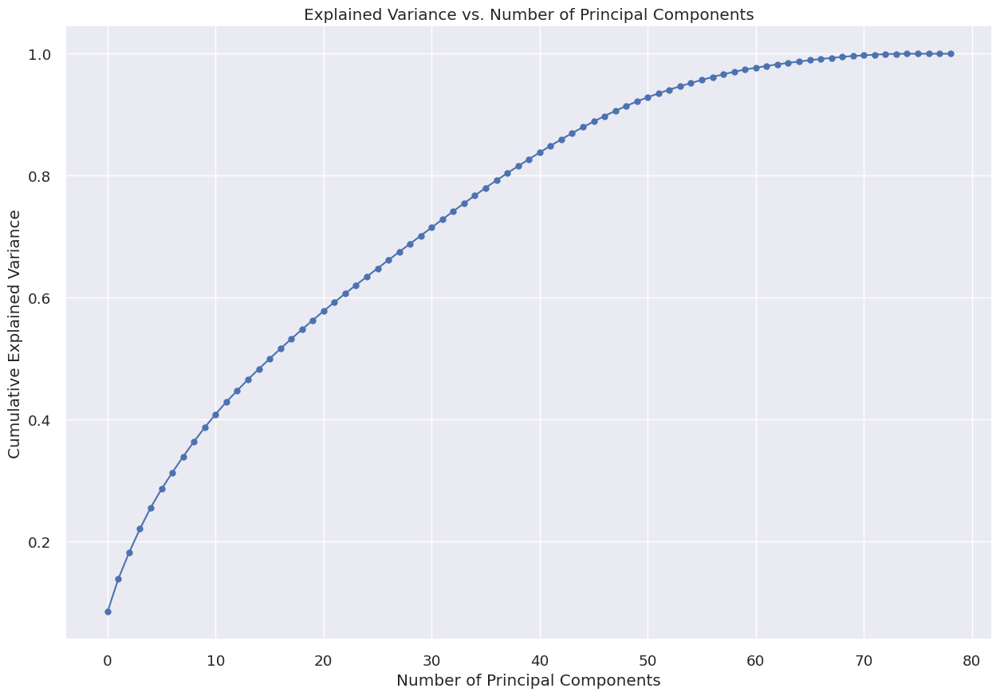

In [ ]:
pca = PCA()
pca.fit(data_scaled)

cumulative_explained_variance = np.cumsum(pca.explained_variance_ratio_)

plt.figure(figsize=(15, 10))
plt.plot(cumulative_explained_variance, marker='o')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance vs. Number of Principal Components')
plt.grid(True)
plt.show()

In [ ]:
n_components = 55 # No. of principal components which describe ~95% of the variance
pca = PCA(n_components=n_components)
data_pca = pca.fit_transform(data_scaled)

print(f'Original shape: {data_scaled.shape}')
print(f'Transformed shape: {data_pca.shape}')

Original shape: (2404, 79)
Transformed shape: (2404, 55)


### **9.1 Applying K-Means Clustering and Visualizing the PCA Data**

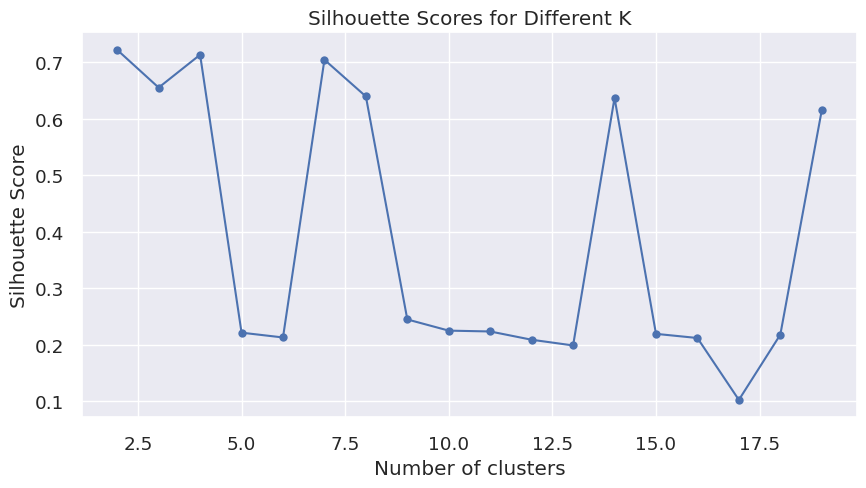

In [ ]:
silhouette_scores = []

for i in range(2, max_clusters):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10)
    labels = kmeans.fit_predict(data_pca)
    silhouette_scores.append(silhouette_score(data_pca, labels))

plt.figure(figsize=(10, 5))
plt.plot(range(2, max_clusters), silhouette_scores, marker='o')
plt.title('Silhouette Scores for Different K')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


K-Means Silhouette Score:  0.7019228628476053
K-Means Calinski-Harabasz Score:  94.16813943842621
K-Means Davies-Bouldin Score:  1.35406741267151


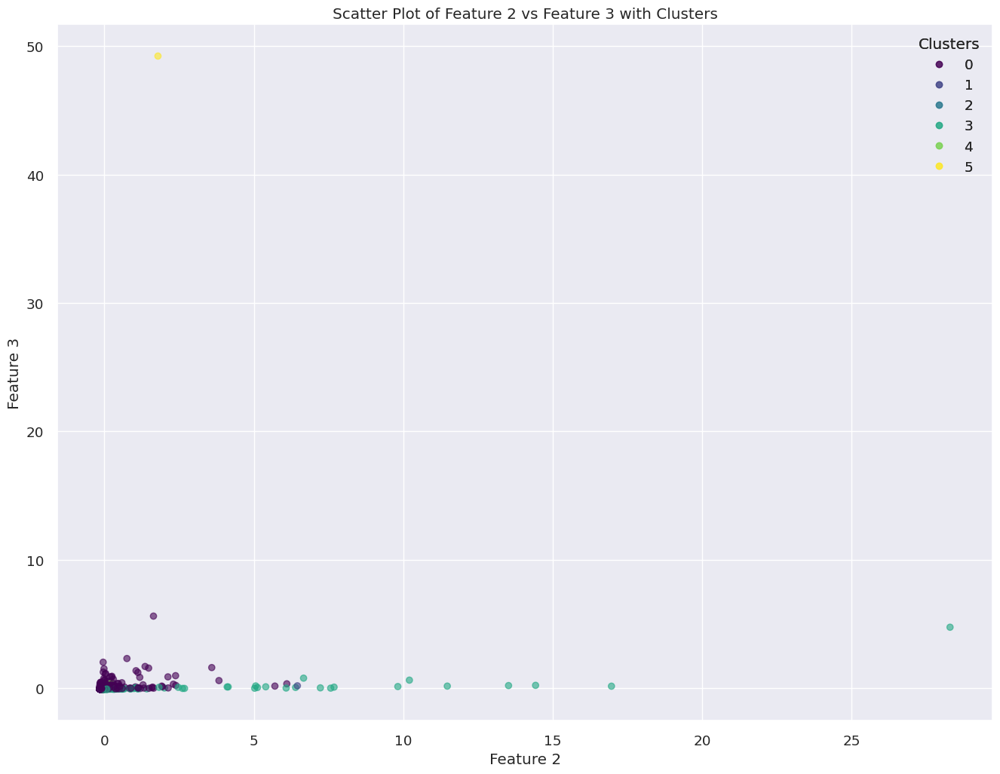

In [ ]:
optimal_k = 6
kmeans = KMeans(n_clusters=optimal_k)
kmeans_labels = kmeans.fit_predict(data_scaled)

silhouette_avg = silhouette_score(data_scaled, kmeans_labels)
calinski_harabasz = calinski_harabasz_score(data_scaled, kmeans_labels)
davies_bouldin = davies_bouldin_score(data_scaled, kmeans_labels)

print("K-Means Silhouette Score: ", silhouette_avg)
print("K-Means Calinski-Harabasz Score: ", calinski_harabasz)
print("K-Means Davies-Bouldin Score: ", davies_bouldin)


clusters = kmeans_labels
data_column = data_scaled[:, 2]
plt.figure(figsize=(16, 12))
scatter = plt.scatter(data_column, data_scaled[:, 3], c=clusters, cmap='viridis', alpha=0.6)  # Using second column for x-axis and third column for y-axis
legend1 = plt.legend(*scatter.legend_elements(), title="Clusters")
plt.gca().add_artist(legend1)
plt.xlabel('Feature 2')
plt.ylabel('Feature 3')
plt.title('Scatter Plot of Feature 2 vs Feature 3 with Clusters')

plt.show()

### **9.1 Applying the PCA Data to the above Classical Algorithms for Quick Analysis**

In [ ]:
def evaluate_clustering(model, data, labels):
    silhouette = silhouette_score(data, labels)
    calinski_harabasz = calinski_harabasz_score(data, labels)
    davies_bouldin = davies_bouldin_score(data, labels)
    return silhouette, calinski_harabasz, davies_bouldin

def cluster_and_evaluate(data, algorithm, cluster_range):
    results = []
    for n_clusters in cluster_range:
        if algorithm == 'kmeans':
            model = KMeans(n_clusters=n_clusters)
        elif algorithm == 'agglomerative':
            model = AgglomerativeClustering(n_clusters=n_clusters)
        elif algorithm == 'gmm':
            model = GaussianMixture(n_components=n_clusters)

        labels = model.fit_predict(data)
        silhouette, calinski_harabasz, davies_bouldin = evaluate_clustering(model, data, labels)

        results.append({
            'n_clusters': n_clusters,
            'Silhouette Score': silhouette,
            'Calinski-Harabasz Score': calinski_harabasz,
            'Davies-Bouldin Score': davies_bouldin
        })

    return pd.DataFrame(results)

cluster_range = range(2, 20)
kmeans_results = cluster_and_evaluate(data_pca, 'kmeans', cluster_range)
print("KMeans Clustering Results:")
print(kmeans_results)

agglomerative_results = cluster_and_evaluate(data_pca, 'agglomerative', cluster_range)
print("\nAgglomerative Clustering Results:")
print(agglomerative_results)

gmm_results = cluster_and_evaluate(data_pca, 'gmm', cluster_range)
print("\nGaussian Mixture Model Clustering Results:")
print(gmm_results)

# DBSCAN
def dbscan_evaluation(data, eps_range, min_samples):
    results = []
    for eps in eps_range:
        model = DBSCAN(eps=eps, min_samples=min_samples)
        labels = model.fit_predict(data)
        if len(np.unique(labels)) > 1:  # Ensure there is more than one cluster
            silhouette, calinski_harabasz, davies_bouldin = evaluate_clustering(model, data, labels)
            results.append({
                'eps': eps,
                'Silhouette Score': silhouette,
                'Calinski-Harabasz Score': calinski_harabasz,
                'Davies-Bouldin Score': davies_bouldin
            })
    return pd.DataFrame(results)

eps_range = np.arange(0.1, 3.0, 0.1)
min_samples = 5

dbscan_results = dbscan_evaluation(data_pca, eps_range, min_samples)
print("\nDBSCAN Clustering Results:")
print(dbscan_results)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` ex

KMeans Clustering Results:
    n_clusters  Silhouette Score  Calinski-Harabasz Score  \
0            2          0.721414               164.248565   
1            3          0.715472               129.573879   
2            4          0.712373               121.571046   
3            5          0.712795               116.959169   
4            6          0.651422               104.355877   
5            7          0.651666               107.772285   
6            8          0.213113                96.657695   
7            9          0.668195               101.735506   
8           10          0.627483                99.787045   
9           11          0.650352               102.259449   
10          12          0.651674                96.353830   
11          13          0.229420                92.488812   
12          14          0.211610               103.287268   
13          15          0.230226                99.468079   
14          16          0.233319                98.697055 

## **10. Final Results Intepretation of Classical Machine Learning Clustering Models with and without PCA**

In [ ]:
def evaluate_clustering(model, data, labels):
    silhouette = silhouette_score(data, labels)
    return silhouette

def cluster_and_evaluate(data, algorithm, cluster_range):
    results = []
    best_silhouette = -1
    best_n_clusters = -1

    for n_clusters in cluster_range:
        if algorithm == 'kmeans':
            model = KMeans(n_clusters=n_clusters)
        elif algorithm == 'agglomerative':
            model = AgglomerativeClustering(n_clusters=n_clusters)
        elif algorithm == 'dbscan':
            model = DBSCAN(eps=0.8, min_samples=5)

        labels = model.fit_predict(data)
        silhouette = evaluate_clustering(model, data, labels)
        results.append({
            'n_clusters': n_clusters,
            'Silhouette Score': silhouette
        })

        if silhouette > best_silhouette:
            best_silhouette = silhouette
            best_n_clusters = n_clusters

    return pd.DataFrame(results), best_silhouette, best_n_clusters

cluster_range = range(4, 20)

kmeans_results, kmeans_best_silhouette, kmeans_best_n_clusters = cluster_and_evaluate(data_pca, 'kmeans', cluster_range)

agglomerative_results, agglomerative_best_silhouette, agglomerative_best_n_clusters = cluster_and_evaluate(data_pca, 'agglomerative', cluster_range)

dbscan_results, dbscan_best_silhouette, dbscan_best_n_clusters = cluster_and_evaluate(data_pca, 'dbscan', cluster_range)

results_table = pd.DataFrame({
    'Clustering Method': ['KMeans', 'Agglomerative', 'DBSCAN'],
    'Silhouette Score': [kmeans_best_silhouette, agglomerative_best_silhouette, dbscan_best_silhouette],
    'Number of Clusters': [kmeans_best_n_clusters, agglomerative_best_n_clusters, dbscan_best_n_clusters]
})

print("Highest Silhouette Score for Each Clustering Method:")
results_table

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` ex

Highest Silhouette Score for Each Clustering Method:


,Clustering Method,Silhouette Score,Number of Clusters
0,KMeans,0.696623,5
1,Agglomerative,0.593075,4
2,DBSCAN,0.022895,4


##**11. Deep Learning Based Clustering**

### **11.1 Variational Auto Encoder DNN for Clustering**

In [ ]:
from keras import backend as K
from keras.layers import Input, Dense, Lambda
from keras.models import Model
import tensorflow as tf

# Define dimensions
input_dim = data_scaled.shape[1]
latent_dim = 2

# Encoder
inputs = Input(shape=(input_dim,))
h = Dense(64, activation='relu')(inputs)
h = Dense(32, activation='relu')(h)
z_mean = Dense(latent_dim)(h)
z_log_var = Dense(latent_dim)(h)

# Sampling function
def sampling(args):
    z_mean, z_log_var = args
    batch = K.shape(z_mean)[0]
    dim = K.int_shape(z_mean)[1]
    epsilon = K.random_normal(shape=(batch, dim))
    return z_mean + K.exp(0.5 * z_log_var) * epsilon

z = Lambda(sampling, output_shape=(latent_dim,))([z_mean, z_log_var])

# Decoder
decoder_h = Dense(32, activation='relu')
decoder_mean = Dense(input_dim, activation='sigmoid')
h_decoded = decoder_h(z)
x_decoded_mean = decoder_mean(h_decoded)

# VAE model
vae = Model(inputs, x_decoded_mean)

# VAE loss function
reconstruction_loss = K.sum(K.square(inputs - x_decoded_mean), axis=-1)
reconstruction_loss *= input_dim  # Multiply after calculating the loss
kl_loss = -0.5 * K.sum(1 + z_log_var - K.square(z_mean) - K.exp(z_log_var), axis=-1)
vae_loss = K.mean(reconstruction_loss + kl_loss)

vae.add_loss(vae_loss)

# Compile and train the VAE model
vae.compile(optimizer='adam')
vae.fit(data_scaled, epochs=50, batch_size=32, validation_split=0.2)


AttributeError: module 'keras.api.backend' has no attribute 'sum'

76/76 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` ex

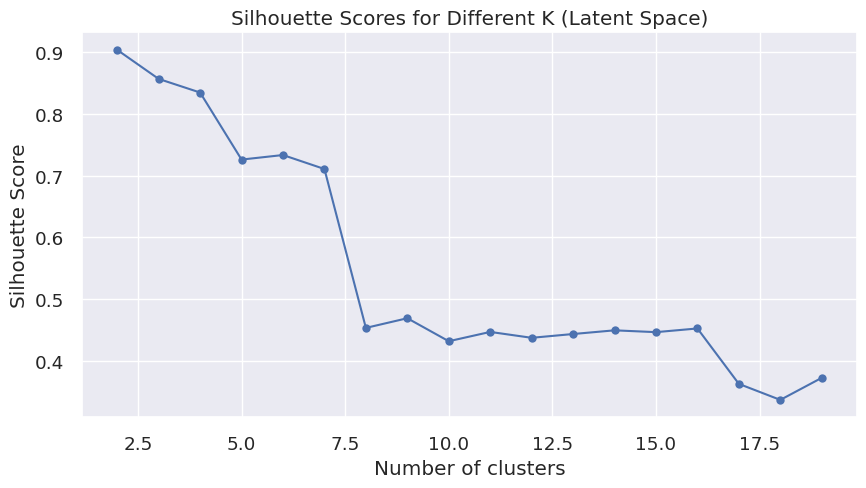

In [ ]:
# Encoder model to extract latent representations
encoder = Model(inputs, z_mean)

# Get the latent representations
latent_representations_km = encoder.predict(data_scaled)

silhouette_scores = []
max_clusters = 20

for i in range(2, max_clusters):
    kmeans = KMeans(n_clusters=i, random_state=0)
    labels = kmeans.fit_predict(latent_representations_km)
    silhouette_scores.append(silhouette_score(latent_representations_km, labels))

plt.figure(figsize=(10, 5))
plt.plot(range(2, max_clusters), silhouette_scores, marker='o')
plt.title('Silhouette Scores for Different K (Latent Space)')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.show()

In [ ]:
optimal_k = 5

kmeans = KMeans(n_clusters=optimal_k, random_state=0)
cluster_labels_km = kmeans.fit_predict(latent_representations_km)

silhouette_dl_kmeans = silhouette_score(latent_representations_km, cluster_labels_km)
dbdlkmeans = davies_bouldin_score(latent_representations_km, cluster_labels_km)
chdlkmeans = calinski_harabasz_score(latent_representations_km, cluster_labels_km)
print(f'Silhouette Score for K-Means with {optimal_k} clusters in latent space: {silhouette_dl_kmeans}')
print(f'Davies Bouldin Score for K-Means with {optimal_k} clusters in latent space: {dbdlkmeans}')
print(f'Calinski Harabazs Score for K-Means with {optimal_k} clusters in latent space: {chdlkmeans}')


Silhouette Score for K-Means with 5 clusters in latent space: 0.7259944677352905
Davies Bouldin Score for K-Means with 5 clusters in latent space: 0.711297101435165
Calinski Harabazs Score for K-Means with 5 clusters in latent space: 1118.9772476052233


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


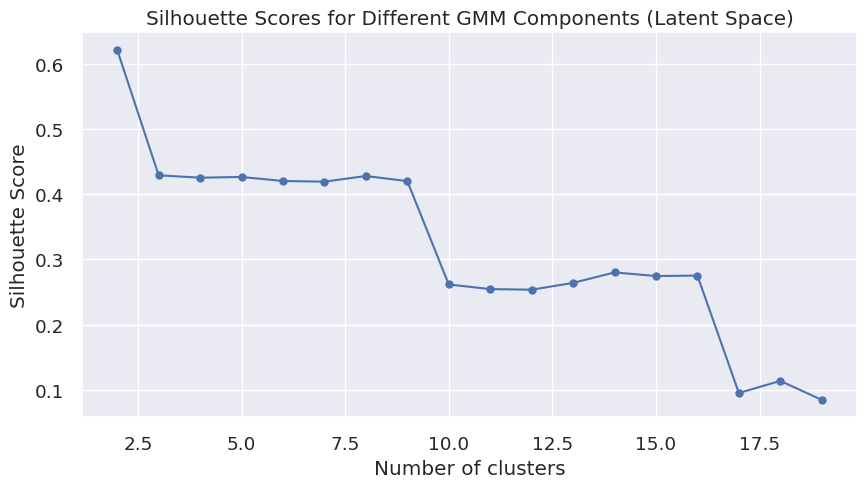

In [ ]:
gmm_silhouette_scores = []

for i in range(2, max_clusters):
    gmm = GaussianMixture(n_components=i, random_state=0)
    gmm_labels = gmm.fit_predict(latent_representations_km)
    gmm_silhouette_scores.append(silhouette_score(latent_representations_km, gmm_labels))

plt.figure(figsize=(10, 5))
plt.plot(range(2, max_clusters), gmm_silhouette_scores, marker='o')
plt.title('Silhouette Scores for Different GMM Components (Latent Space)')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.show()

In [ ]:
optimal_gmm_k = 5

gmm = GaussianMixture(n_components=optimal_gmm_k, random_state=0)
gmm_labels = gmm.fit_predict(latent_representations_km)

gmm_silhouette_avg = silhouette_score(latent_representations_km, gmm_labels)
dbdlgmm = davies_bouldin_score(latent_representations_km, gmm_labels)
chdlgmm = calinski_harabasz_score(latent_representations_km, gmm_labels)

print(f'Davies Bouldin Score for K-Means with {optimal_k} clusters in latent space: {dbdlgmm}')
print(f'Calinski Harabazs Score for K-Means with {optimal_k} clusters in latent space: {chdlgmm}')
print(f'Silhouette Score for GMM with {optimal_gmm_k} clusters in latent space: {gmm_silhouette_avg}')


Davies Bouldin Score for K-Means with 5 clusters in latent space: 5.261375716119619
Calinski Harabazs Score for K-Means with 5 clusters in latent space: 458.7024853735175
Silhouette Score for GMM with 5 clusters in latent space: 0.42623430490493774


### **11.2 Deep Embedded Clustering Model**

In [ ]:
# Autoencoder parameters
input_dim = data_scaled.shape[1]
latent_dim = 10

# Encoder
inputs = Input(shape=(input_dim,))
h = Dense(64)(inputs)
h = LeakyReLU()(h)
h = Dense(32)(h)
h = LeakyReLU()(h)
latent = Dense(latent_dim)(h)

# Decoder
h_decoded = Dense(32)(latent)
h_decoded = LeakyReLU()(h_decoded)
h_decoded = Dense(64)(h_decoded)
h_decoded = LeakyReLU()(h_decoded)
outputs = Dense(input_dim, activation='sigmoid')(h_decoded)

# Autoencoder model
autoencoder = Model(inputs, outputs)
autoencoder.compile(optimizer='adam', loss='mse')

autoencoder.fit(data_scaled, data_scaled, epochs=200, batch_size=64, validation_split=0.2)

encoder = Model(inputs, latent)

latent_representations = encoder.predict(data_scaled)

silhouette_scores = []
for i in range(2, max_clusters):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=42)
    labels = kmeans.fit_predict(latent_representations)
    silhouette_scores.append(silhouette_score(latent_representations, labels))

plt.figure(figsize=(10, 5))
plt.plot(range(2, max_clusters), silhouette_scores, marker='o')
plt.title('Silhouette Scores for Different K')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.show()

optimal_k = 4
kmeans = KMeans(n_clusters=optimal_k, random_state=0)
kmeans.fit(latent_representations)
initial_cluster_centers = kmeans.cluster_centers_

# Clustering Layer with consistent latent_dim
clustering_layer = ClusteringLayer(optimal_k, name='clustering')
dec_model = DECModel(autoencoder, clustering_layer)

dec_model.compile(optimizer='adam')

_ = dec_model.predict(data_scaled[:1])

dec_model.clustering_layer.set_weights([initial_cluster_centers])

dec_model.fit(data_scaled, data_scaled, epochs=50, batch_size=64, validation_split=0.2)


Epoch 1/200
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - loss: 1.2857 - val_loss: 1.2836
Epoch 2/200
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0312 - val_loss: 1.0876
Epoch 3/200
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.0397 - val_loss: 1.0677
Epoch 4/200
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0227 - val_loss: 1.0603
Epoch 5/200
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.0691 - val_loss: 1.0533
Epoch 6/200
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.8799 - val_loss: 1.0454
Epoch 7/200
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.9497 - val_loss: 1.0388
Epoch 8/200
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.9340 - val_loss: 1.0345
Epoch 9/200
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.8074 - val_loss: 1.0292
Epoch 10/200
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.8316 - val_loss: 1.0269
Epoch 11/200
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.8148 - val_loss: 1.0255
Epoch 12/200
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.

NameError: name 'max_clusters' is not defined

In [ ]:
input_dim = data_scaled.shape[1]
latent_dim = 10

# Encoder
inputs = Input(shape=(input_dim,))
h = Dense(64)(inputs)
h = LeakyReLU()(h)
h = Dense(32)(h)
h = LeakyReLU()(h)
latent = Dense(latent_dim)(h)

# Decoder
h_decoded = Dense(32)(latent)
h_decoded = LeakyReLU()(h_decoded)
h_decoded = Dense(64)(h_decoded)
h_decoded = LeakyReLU()(h_decoded)
outputs = Dense(input_dim, activation='sigmoid')(h_decoded)

# Autoencoder model
autoencoder = Model(inputs, outputs)
autoencoder.compile(optimizer='adam', loss='mse')

autoencoder.fit(data_scaled, data_scaled, epochs=200, batch_size=64, validation_split=0.2)

encoder = Model(inputs, latent)

latent_representations = encoder.predict(data_scaled)

silhouette_scores = []

for i in range(2, max_clusters):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=42)
    labels = kmeans.fit_predict(latent_representations)
    silhouette_scores.append(silhouette_score(latent_representations, labels))

plt.figure(figsize=(10, 5))
plt.plot(range(2, max_clusters), silhouette_scores, marker='o')
plt.title('Silhouette Scores for Different K')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.show()

In [ ]:
optimal_k = 4
kmeans = KMeans(n_clusters=optimal_k, random_state=0)
kmeans.fit(latent_representations)
initial_cluster_centers = kmeans.cluster_centers_

### **11.3 Deep InfoMax Clustering Network**

In [ ]:
!pip install torch torchvision pytorch-lightning scikit-learn

In [ ]:
class DeepInfoMax(pl.LightningModule):
    def __init__(self, input_dim, latent_dim):
        super(DeepInfoMax, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(512, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(256, latent_dim)
        )
        self.discriminator = nn.Sequential(
            nn.Linear(latent_dim, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(256, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(),
            nn.Linear(512, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        z = self.encoder(x)
        return z

    def training_step(self, batch, batch_idx):
        x = batch[0]
        z = self.encoder(x)
        pos = self.discriminator(z)
        neg = self.discriminator(torch.roll(z, 1, 0))

        pos_loss = -torch.log(pos + 1e-6).mean()
        neg_loss = -torch.log(1 - neg + 1e-6).mean()

        loss = pos_loss + neg_loss
        self.log('train_loss', loss)
        return loss

    def configure_optimizers(self):
        optimizer = optim.Adam(self.parameters(), lr=1e-3, weight_decay=1e-5)
        scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5)
        return {
            'optimizer': optimizer,
            'lr_scheduler': {
                'scheduler': scheduler,
                'monitor': 'train_loss',
            }
        }

    def on_before_zero_grad(self, optimizer):
        # Gradient clipping to avoid exploding gradients
        torch.nn.utils.clip_grad_norm_(self.parameters(), max_norm=1.0)

In [ ]:
# Convert data to PyTorch tensors
X_tensor = torch.tensor(data_scaled, dtype=torch.float32)
dataset = TensorDataset(X_tensor)
dataloader = DataLoader(dataset, batch_size=64, shuffle=True)

# Define model
input_dim = data_scaled.shape[1]
latent_dim = 10
model = DeepInfoMax(input_dim, latent_dim)

# Train model
trainer = pl.Trainer(max_epochs=10)
trainer.fit(model, dataloader)

In [ ]:
# Get the learned representations
model.eval()
with torch.no_grad():
    z = model.encoder(X_tensor).numpy()

results = []

for n_clusters in range(2, 21):
    kmeans = KMeans(n_clusters=n_clusters)
    clusters = kmeans.fit_predict(z)

    silhouette_avg = silhouette_score(z, clusters)
    davies_bouldin = davies_bouldin_score(z, clusters)
    calinski_harabasz = calinski_harabasz_score(z, clusters)

    results.append({
        'n_clusters': n_clusters,
        'silhouette_score': silhouette_avg,
        'davies_bouldin_index': davies_bouldin,
        'calinski_harabasz_index': calinski_harabasz
    })

results_df = pd.DataFrame(results)

print(results_df)

In [ ]:
model.eval()
with torch.no_grad():
    z = model.encoder(X_tensor).numpy()

n_clusters = 4
kmeans = KMeans(n_clusters=n_clusters)
clusters_dim1 = kmeans.fit_predict(z)

data_scaled_with_clusters = np.hstack((data_scaled, clusters_dim1.reshape(-1, 1)))

column_names = [f'feature_{i}' for i in range(data_scaled.shape[1])] + ['cluster']
df_clusters = pd.DataFrame(data_scaled_with_clusters, columns=column_names)

In [ ]:
silhouette_avg = silhouette_score(z, clusters_dim1)
davies_bouldin = davies_bouldin_score(z, clusters_dim1)
calinski_harabasz = calinski_harabasz_score(z, clusters_dim1)

print(f'Silhouette Score: {silhouette_avg}')
print(f'Davies-Bouldin Index: {davies_bouldin}')
print(f'Calinski-Harabasz Index: {calinski_harabasz}')

In [ ]:
clusters_dim1 = pd.Series(clusters_dim1)
clusters_dim1.value_counts()

### **11.4 Deep InfoMax Clustering Network Type II**

In [ ]:
def build_encoder(input_dim, latent_dim):
    input_layer = Input(shape=(input_dim,))
    x = Dense(512)(input_layer)
    x = BatchNormalization()(x)
    x = LeakyReLU()(x)
    x = Dense(256)(x)
    x = BatchNormalization()(x)
    x = LeakyReLU()(x)
    latent_space = Dense(latent_dim)(x)
    encoder = Model(input_layer, latent_space, name='encoder')
    return encoder

input_dim = data_scaled.shape[1]
latent_dim = 64
encoder = build_encoder(input_dim, latent_dim)
encoder.summary()

In [ ]:
def mi_estimation_loss(y_true, y_pred):
    mi_loss = -K.mean(y_true * K.log(y_pred + K.epsilon()) + (1 - y_true) * K.log(1 - y_pred + K.epsilon()))
    return mi_loss

input_layer = Input(shape=(input_dim,))
encoded = encoder(input_layer)

output_layer = Dense(1, activation='sigmoid')(encoded)
dim_model = Model(input_layer, output_layer)

dim_model.compile(optimizer='adam', loss=mi_estimation_loss)

y_train = np.ones((data_scaled.shape[0], 1))

dim_model.fit(data_scaled, y_train, epochs=50, batch_size=64, validation_split=0.2)
representations = encoder.predict(data_scaled)

In [ ]:
wcss = []
for i in range(1, 20):
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(representations)
    wcss.append(kmeans.inertia_)

import matplotlib.pyplot as plt

plt.plot(range(1, 20), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [ ]:
optimal_clusters = 4
kmeans = KMeans(n_clusters=optimal_clusters)
cluster_assignments = kmeans.fit_predict(representations)

In [ ]:
silhouette_avg_2 = silhouette_score(representations, cluster_assignments)
print(f'Silhouette Score: {silhouette_avg_2}')

### **11.5 Self Organizing Maps with Deep Learning**

In [ ]:
pip install minisom

  Using cached MiniSom-2.3.2.tar.gz (10 kB)
  Preparing metadata (setup.py) ... done
  Created wheel for minisom: filename=MiniSom-2.3.2-py3-none-any.whl size=10651 sha256=b1f8881ac5a89d3fa4ceab37d3a1025c076b71a4d6e15cd8cd24dca99395e64f
  Stored in directory: /root/.cache/pip/wheels/b4/f6/8a/9daf8831901c3e3805775633404248f10663d1c80b7e5a1314
Successfully built minisom


In [ ]:
from minisom import MiniSom
# Define the dimensions of the SOM grid
som_x = 10
som_y = 10

# Initialize the SOM
som = MiniSom(x=som_x, y=som_y, input_len=data_scaled.shape[1], sigma=1.0, learning_rate=0.5)

# Initialize the weights
som.random_weights_init(80)

# Train the SOM
print("Training SOM...")
som.train_random(data_scaled, 10000)

print("SOM training complete.")

# U-Matrix
u_matrix = som.distance_map().T
plt.figure(figsize=(15, 15))
plt.imshow(u_matrix, cmap='bone_r', aspect='auto')
plt.colorbar()
plt.title('U-Matrix')
plt.show()

# Hit Map
plt.figure(figsize=(15, 15))
plt.pcolor(u_matrix.T, cmap='bone_r')
plt.colorbar()
for i, x in enumerate(data_scaled):
    w = som.winner(x)
    plt.text(w[0] + 0.5, w[1] + 0.5, str(i), color=plt.cm.rainbow(i / len(data_scaled)), fontdict={'weight': 'bold', 'size': 11})
plt.title('SOM Hit Map')
plt.show()

# Quantization and Topographic Errors
quantization_errors = som.quantization_error(data_scaled)
topographic_errors = som.topographic_error(data_scaled)
print(f'Quantization Error: {quantization_errors}')
print(f'Topographic Error: {topographic_errors}')

cluster_assignments = np.array([som.winner(x) for x in data_scaled])
flattened_cluster_assignments = [np.ravel_multi_index(c, (som_x, som_y)) for c in cluster_assignments]

silhouette_avg_som = silhouette_score(data_scaled, flattened_cluster_assignments)
db_index = davies_bouldin_score(data_scaled, flattened_cluster_assignments)
calinskiindex = calinski_harabasz_score(data_scaled, flattened_cluster_assignments)
print(f'Silhouette Score: {silhouette_avg_som}')
print(f'Davies-Bouldin Index: {db_index}')
print(f'Calinski Harabasz Index: {calinskiindex}')


TypeError: 'int' object is not subscriptable

## **12 Final Results Intepretation of Deep Learning-Based Clustering Networks**

In [ ]:
dl_metrics_summary = pd.DataFrame({
    'Method': ['Vartional Autoencoder (K-Means)', 'Variation Autoencoder (GMM)', 'Deep InfoMax Clustering 1','Self Organzing Maps' ],
    'Highest Silhouette Score': [silhouette_dl_kmeans, gmm_silhouette_avg, silhouette_avg, silhouette_avg_som],
    'Number of Clusters': [4,5,11,4,4,10]
})

dl_metrics_summary

NameError: name 'pd' is not defined

#  **Part II: Interpretation & Segmentation of the optimal clustering output**

##**Descriptive Analysis of Clusters**

In [ ]:
final_agg.replace([np.inf, -np.inf], np.nan, inplace=True)

final_agg.dropna(inplace=True)

final_agg.reset_index(drop=True, inplace=True)

In [ ]:
final_agg = final_agg.replace([float('inf'), float('-inf')], pd.NA).dropna()
final_agg = final_agg.dropna()

final_agg['Cluster'] = clusters_dim1
data_scaled=pd.DataFrame(data_scaled)
data_scaled['Cluster']=clusters_dim1

cluster_distribution = final_agg['Cluster'].value_counts().sort_index()
print(cluster_distribution)

In [ ]:
plt.figure(figsize=(8, 6))
cluster_distribution.plot(kind='bar', color='skyblue')
plt.title('Frequency of Clusters')
plt.xlabel('Clusters')
plt.ylabel('Frequency')
plt.xticks(rotation=0)
plt.grid(axis='y')
plt.show()

In [ ]:
grouped = final_agg.groupby('Cluster')

for cluster, group in grouped:
    print(f"Summary statistics for cluster {cluster}:\n")
    summary = group.describe()
    print(tabulate(summary, headers='keys', tablefmt='psql'))
    print("\n" + "="*80 + "\n")

In [ ]:
important_features = ['total_transactions','total_value', 'avg_value','max_value', 'failed_transactions', 'transaction_frequency', 'avg_gas', 'total_gas','total_gas_price', 'max_gas','function_Internal_sum','gas_efficiency','activity_duration','interaction_diversity', 'unique_counterparties','total_usd_value','max_usd_value', 'unique_tokens',  'balance_ETH', 'balance_USDT']

In [ ]:
# Calculate median values for each cluster
cluster_medians = final_agg.groupby('Cluster')[important_features].mean()

cluster_medians_summary = cluster_medians.T
cluster_medians_summary

Cluster,0,1,2,3
total_transactions,1.717892e+03,1.224788e+04,1.255567e+04,1.405580e+04
total_value,1.392389e+02,6.388006e+03,2.652857e+03,6.827985e+03
avg_value,3.117191e-01,2.054835e+01,1.255876e+00,1.787347e+00
max_value,1.359627e+01,1.752141e+02,6.698653e+01,9.888586e+01
failed_transactions,5.824788e+01,1.802188e+03,5.618476e+02,1.142977e+03
transaction_frequency,5.636488e+00,9.930525e+01,3.489091e+01,8.310786e+01
avg_gas,1.958636e-13,5.419220e-13,5.344510e-13,3.916080e-13
total_gas,5.391940e-10,8.523419e-09,6.638539e-09,6.196894e-09
total_gas_price,1.092885e+14,8.975886e+14,2.670349e+15,6.200295e+14
max_gas,1.230683e-12,1.878556e-12,5.528183e-12,5.099007e-12


In [ ]:
important_features1 = ['total_transactions','total_value', 'avg_value', 'max_value', 'failed_transactions', 'avg_gas', 'total_gas','total_usd_value','max_usd_value', 'unique_tokens',  'balance_ETH', 'balance_USDT']
cluster_summary = final_agg.groupby('Cluster')[important_features1].describe()
cluster_summary_df = cluster_summary.stack(level=0).reset_index()

cluster_summary_df.columns = ['Cluster', 'Feature', 'Count', 'Mean', 'Std', 'Min', '25%', '50%', '75%', 'Max']

print(tabulate(cluster_summary_df, headers='keys', tablefmt='grid', showindex=False))

+-----------+---------------------+---------+------------------+------------------+----------------+------------------+------------------+------------------+------------------+
|   Cluster | Feature             |   Count |             Mean |              Std |            Min |              25% |              50% |              75% |              Max |
+===========+=====================+=========+==================+==================+================+==================+==================+==================+==================+
|         0 | avg_gas             |    2239 |      1.95864e-13 |      1.58136e-13 |    3.06583e-14 |      1.22211e-13 |      1.57853e-13 |      2.04976e-13 |      2.08785e-12 |
+-----------+---------------------+---------+------------------+------------------+----------------+------------------+------------------+------------------+------------------+
|         0 | avg_value           |    2239 |      0.311719    |      0.676495    |    0           |      0.0277377

In [ ]:
X = final_agg.drop(columns=['origin','first_transaction_date','last_transaction_date','Cluster'])
y = final_agg['Cluster']

# Train a RandomForestClassifier to determine feature importance
model = RandomForestClassifier(n_estimators=100)
model.fit(X, y)

importance = model.feature_importances_
feature_importance_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': importance
}).sort_values(by='Importance', ascending=False)

feature_importance_df=pd.DataFrame(feature_importance_df)
print(tabulate(feature_importance_df, headers='keys', tablefmt='grid', showindex=False))

+----------------------------------------------------------------------------------------------------------------------------------------------------+--------------+
| Feature                                                                                                                                            |   Importance |
+====================================================================================================================================================+==============+
| total_usd_value                                                                                                                                    |  0.0772619   |
+----------------------------------------------------------------------------------------------------------------------------------------------------+--------------+
| max_usd_value                                                                                                                                      |  0.0725002   |
+---

In [ ]:
# Shapiro-Wilk test for normality
normality_results = {}
for feature in important_features:
    normality_results[feature] = {}
    for cluster in sorted(final_agg['Cluster'].unique()):
        stat, p_value = shapiro(final_agg[final_agg['Cluster'] == cluster][feature])
        normality_results[feature][f'Cluster {cluster}'] = p_value

# Convert results to DataFrame and ensure columns are in order
normality_df = pd.DataFrame(normality_results).T
normality_df = normality_df[sorted(normality_df.columns)]  # Sort columns by cluster order

# Apply normality check for each cluster
for col in normality_df.columns:
    normality_df[f'{col}_is_normal'] = normality_df[col].apply(lambda p: 'Yes' if p > 0.05 else 'No')

normality_df

,Cluster 0,Cluster 1,Cluster 2,Cluster 3,Cluster 0_is_normal,Cluster 1_is_normal,Cluster 2_is_normal,Cluster 3_is_normal
total_transactions,1.748649e-67,4.198393e-02,2.136564e-11,1.670084e-04,No,No,No,No
total_value,2.047232e-71,6.137652e-04,3.507051e-17,1.392550e-10,No,No,No,No
avg_value,2.726785e-66,5.601004e-08,4.747597e-20,1.877297e-12,No,No,No,No
max_value,9.649838e-64,5.201436e-05,3.892558e-16,5.939664e-11,No,No,No,No
failed_transactions,7.808581e-73,2.261364e-06,8.582581e-20,2.433403e-13,No,No,No,No
transaction_frequency,8.709445e-69,9.944092e-07,1.038385e-17,2.500426e-12,No,No,No,No
avg_gas,9.701473e-62,9.297491e-06,5.517819e-18,4.215895e-10,No,No,No,No
total_gas,9.817078e-69,1.453114e-05,1.454940e-12,5.970836e-06,No,No,No,No
total_gas_price,9.108921e-70,1.419484e-06,8.367801e-17,9.441795e-05,No,No,No,No
max_gas,7.633652e-68,1.818169e-04,1.235162e-13,2.433332e-09,No,No,No,No


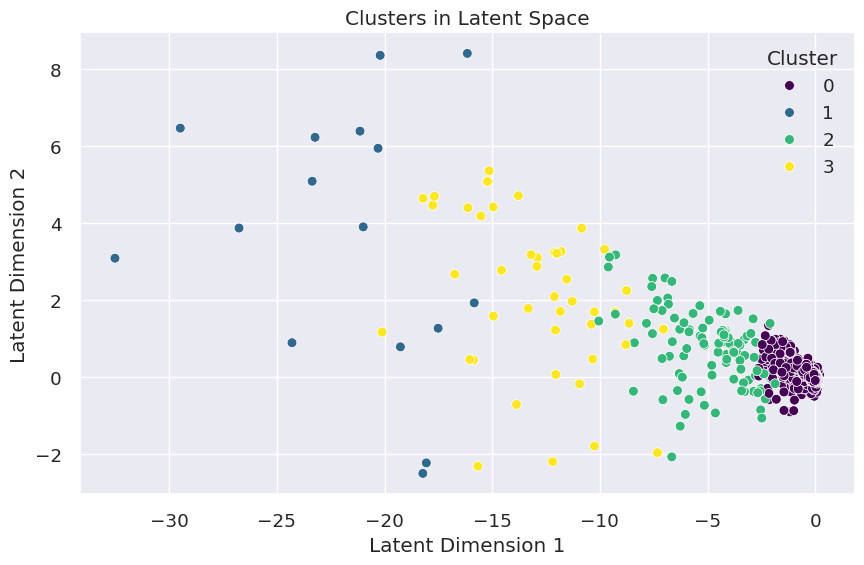

In [ ]:
# Assuming latent_representations and cluster_assignments are defined
plt.figure(figsize=(10, 6))
sns.scatterplot(x=z[:, 0], y=z[:, 1], hue=clusters_dim1, palette='viridis', s=50)
plt.title('Clusters in Latent Space')
plt.xlabel('Latent Dimension 1')
plt.ylabel('Latent Dimension 2')
plt.legend(title='Cluster')
plt.show()


In [ ]:
results = []

for cluster_id in [0, 2, 3]:  # Only considering clusters 0, 2, and 3
    cluster_data = final_agg[final_agg['Cluster'] == cluster_id]

    for feature in important_features:
        feature_data = cluster_data[feature]
        n = len(feature_data)

        # Calculate mean, SEM, and 95% CI using CLT
        mean = np.mean(feature_data)
        std_dev = np.std(feature_data, ddof=1)
        sem = std_dev / np.sqrt(n)
        t_critical = stats.t.ppf(0.975, df=n-1)  # 95% CI, two-tailed
        ci_low = mean - t_critical * sem
        ci_high = mean + t_critical * sem

        # Store results
        results.append({'Cluster': cluster_id,
                        'Feature': feature,
                        'Mean': mean,
                        'SEM': sem,
                        'CI_low': ci_low,
                        'CI_high': ci_high})

results_df = pd.DataFrame(results)

for cluster_id in [0, 2, 3]:
    cluster_df = results_df[results_df['Cluster'] == cluster_id]
    print(f"\nCluster {cluster_id} Results:")
    print(tabulate(cluster_df, headers='keys', tablefmt='fancy_grid', showindex=False))


Cluster 0 Results:
╒═══════════╤═══════════════════════╤═════════════════╤════════════════╤═════════════════╤═════════════════╕
│   Cluster │ Feature               │            Mean │            SEM │          CI_low │         CI_high │
╞═══════════╪═══════════════════════╪═════════════════╪════════════════╪═════════════════╪═════════════════╡
│         0 │ total_transactions    │  1717.89        │  116.001       │  1490.41        │  1945.37        │
├───────────┼───────────────────────┼─────────────────┼────────────────┼─────────────────┼─────────────────┤
│         0 │ total_value           │   139.239       │   12.1043      │   115.502       │   162.976       │
├───────────┼───────────────────────┼─────────────────┼────────────────┼─────────────────┼─────────────────┤
│         0 │ avg_value             │     0.311719    │    0.0142968   │     0.283683    │     0.339755    │
├───────────┼───────────────────────┼─────────────────┼────────────────┼─────────────────┼─────────────────┤

In [ ]:
results = []

# Resampling and analysis for cluster 1
cluster_id = 1
cluster_data = final_agg[final_agg['Cluster'] == cluster_id]

for feature in important_features:
    feature_data = cluster_data[feature].dropna()  # Drop NaN values

    if len(feature_data) > 0:
        # Bootstrap resampling
        bootstrap_means = []
        for _ in range(100):  # Number of bootstrap samples
            bootstrap_sample = resample(feature_data, replace=True)
            bootstrap_means.append(np.mean(bootstrap_sample))

        bootstrap_means = np.array(bootstrap_means)
        mean = np.mean(bootstrap_means)
        sem = np.std(bootstrap_means, ddof=1)
        t_critical = stats.t.ppf(0.975, df=len(bootstrap_means)-1)  # 95% CI, two-tailed
        ci_low = mean - t_critical * sem
        ci_high = mean + t_critical * sem

        results.append({'Cluster': cluster_id,
                        'Feature': feature,
                        'Mean': mean,
                        'SEM': sem,
                        'CI_low': ci_low,
                        'CI_high': ci_high})

results_df = pd.DataFrame(results)

print(f"\nCluster {cluster_id} Results:")
print(tabulate(results_df, headers='keys', tablefmt='fancy_grid', showindex=False))


Cluster 1 Results:
╒═══════════╤═══════════════════════╤══════════════════╤══════════════════╤══════════════════╤══════════════════╕
│   Cluster │ Feature               │             Mean │              SEM │           CI_low │          CI_high │
╞═══════════╪═══════════════════════╪══════════════════╪══════════════════╪══════════════════╪══════════════════╡
│         1 │ total_transactions    │  11945.6         │   2747.71        │   6493.57        │  17397.7         │
├───────────┼───────────────────────┼──────────────────┼──────────────────┼──────────────────┼──────────────────┤
│         1 │ total_value           │   6192.01        │   2170.35        │   1885.57        │  10498.5         │
├───────────┼───────────────────────┼──────────────────┼──────────────────┼──────────────────┼──────────────────┤
│         1 │ avg_value             │     23.4214      │     20.3262      │    -16.9102      │     63.753       │
├───────────┼───────────────────────┼──────────────────┼────────────

<ipython-input-66-8aa46dc679bf>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Cluster', y=feature, data=final_agg, palette=palette, showfliers=True)
<ipython-input-66-8aa46dc679bf>:7: UserWarning: The palette list has more values (8) than needed (4), which may not be intended.
  sns.boxplot(x='Cluster', y=feature, data=final_agg, palette=palette, showfliers=True)


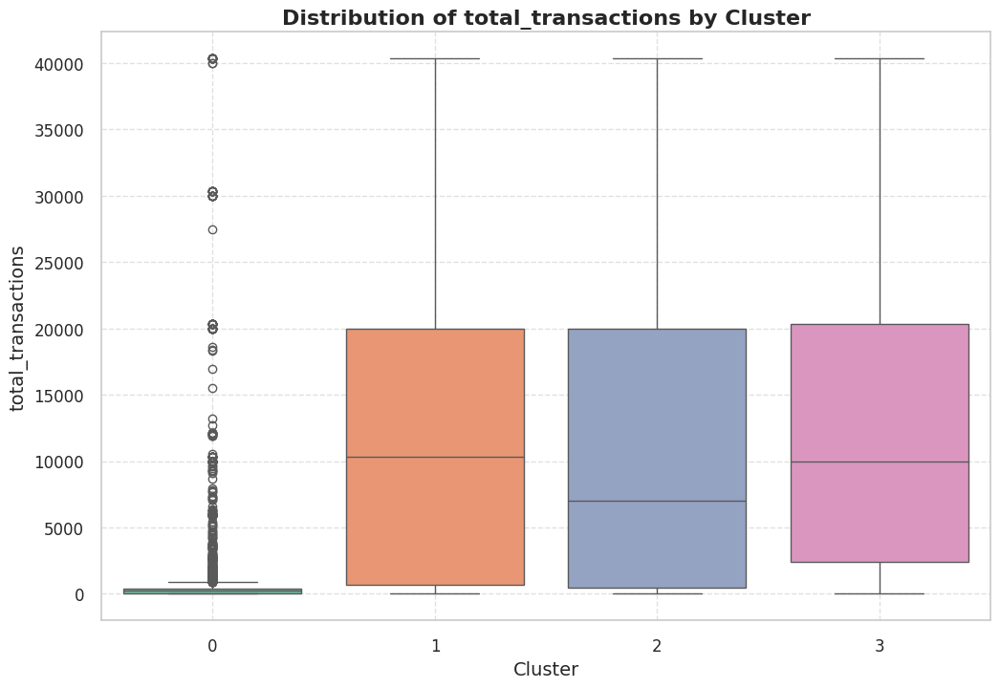

<ipython-input-66-8aa46dc679bf>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Cluster', y=feature, data=final_agg, palette=palette, showfliers=True)
<ipython-input-66-8aa46dc679bf>:7: UserWarning: The palette list has more values (8) than needed (4), which may not be intended.
  sns.boxplot(x='Cluster', y=feature, data=final_agg, palette=palette, showfliers=True)


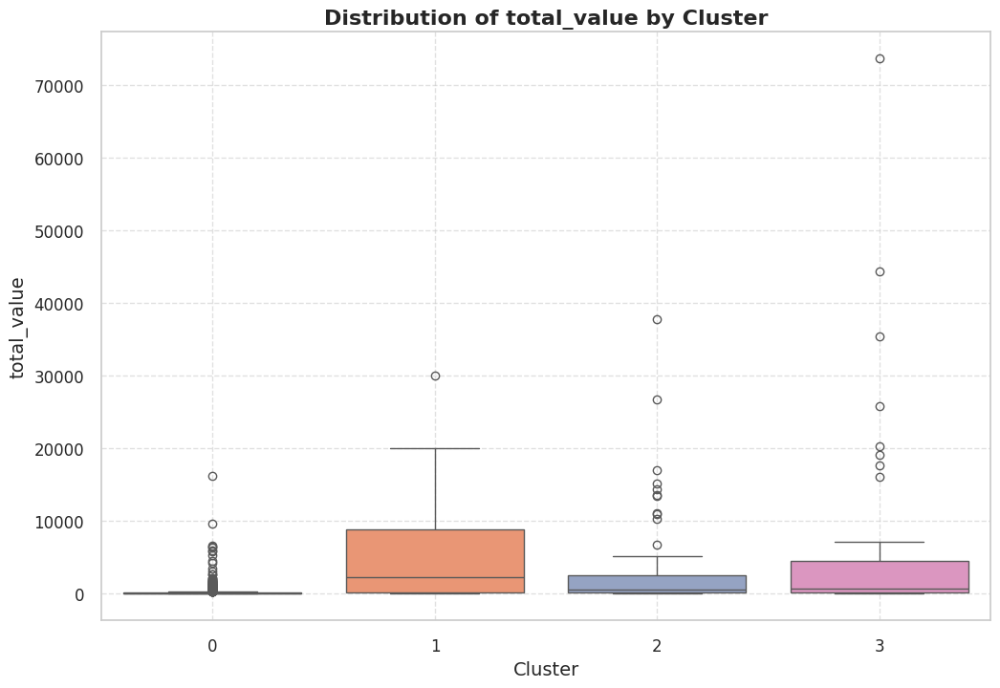

<ipython-input-66-8aa46dc679bf>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Cluster', y=feature, data=final_agg, palette=palette, showfliers=True)
<ipython-input-66-8aa46dc679bf>:7: UserWarning: The palette list has more values (8) than needed (4), which may not be intended.
  sns.boxplot(x='Cluster', y=feature, data=final_agg, palette=palette, showfliers=True)


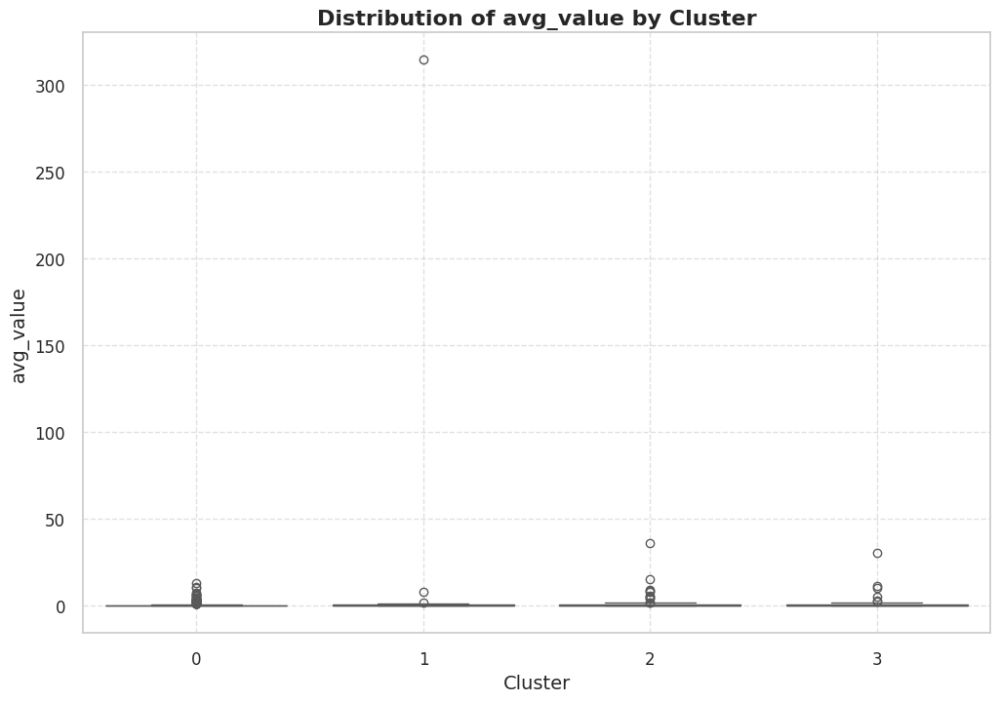

<ipython-input-66-8aa46dc679bf>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Cluster', y=feature, data=final_agg, palette=palette, showfliers=True)
<ipython-input-66-8aa46dc679bf>:7: UserWarning: The palette list has more values (8) than needed (4), which may not be intended.
  sns.boxplot(x='Cluster', y=feature, data=final_agg, palette=palette, showfliers=True)


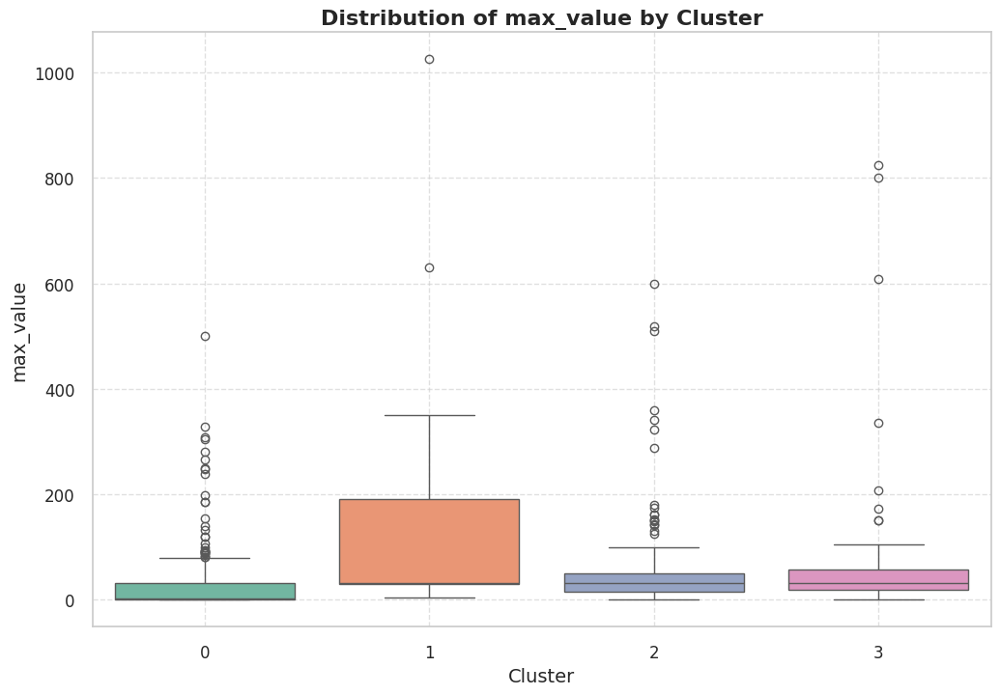

<ipython-input-66-8aa46dc679bf>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Cluster', y=feature, data=final_agg, palette=palette, showfliers=True)
<ipython-input-66-8aa46dc679bf>:7: UserWarning: The palette list has more values (8) than needed (4), which may not be intended.
  sns.boxplot(x='Cluster', y=feature, data=final_agg, palette=palette, showfliers=True)


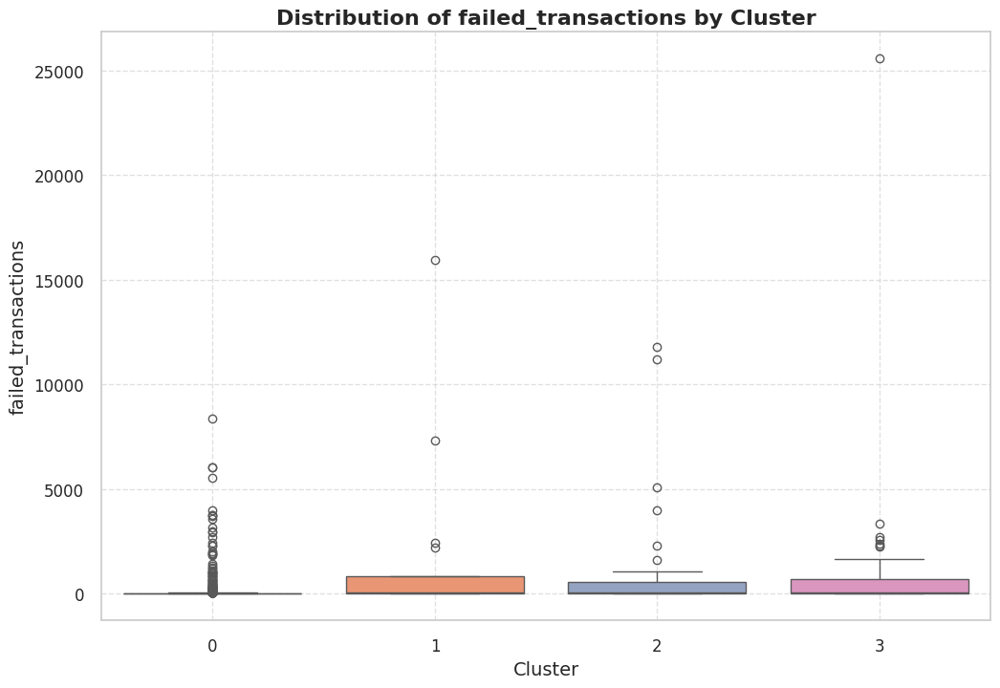

<ipython-input-66-8aa46dc679bf>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Cluster', y=feature, data=final_agg, palette=palette, showfliers=True)
<ipython-input-66-8aa46dc679bf>:7: UserWarning: The palette list has more values (8) than needed (4), which may not be intended.
  sns.boxplot(x='Cluster', y=feature, data=final_agg, palette=palette, showfliers=True)


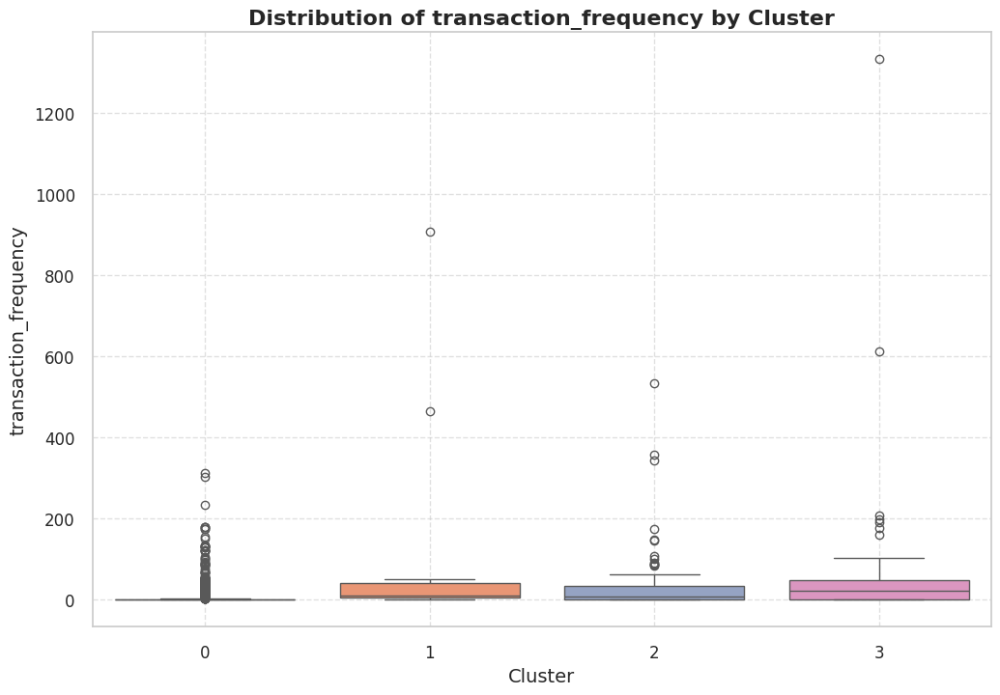

<ipython-input-66-8aa46dc679bf>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Cluster', y=feature, data=final_agg, palette=palette, showfliers=True)
<ipython-input-66-8aa46dc679bf>:7: UserWarning: The palette list has more values (8) than needed (4), which may not be intended.
  sns.boxplot(x='Cluster', y=feature, data=final_agg, palette=palette, showfliers=True)


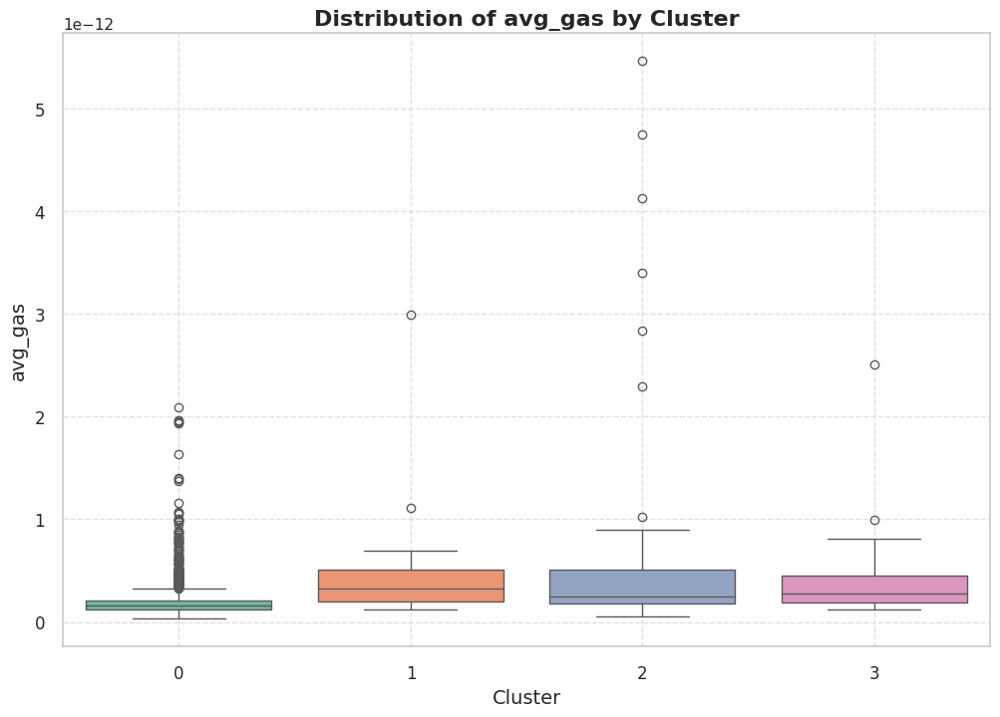

<ipython-input-66-8aa46dc679bf>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Cluster', y=feature, data=final_agg, palette=palette, showfliers=True)
<ipython-input-66-8aa46dc679bf>:7: UserWarning: The palette list has more values (8) than needed (4), which may not be intended.
  sns.boxplot(x='Cluster', y=feature, data=final_agg, palette=palette, showfliers=True)


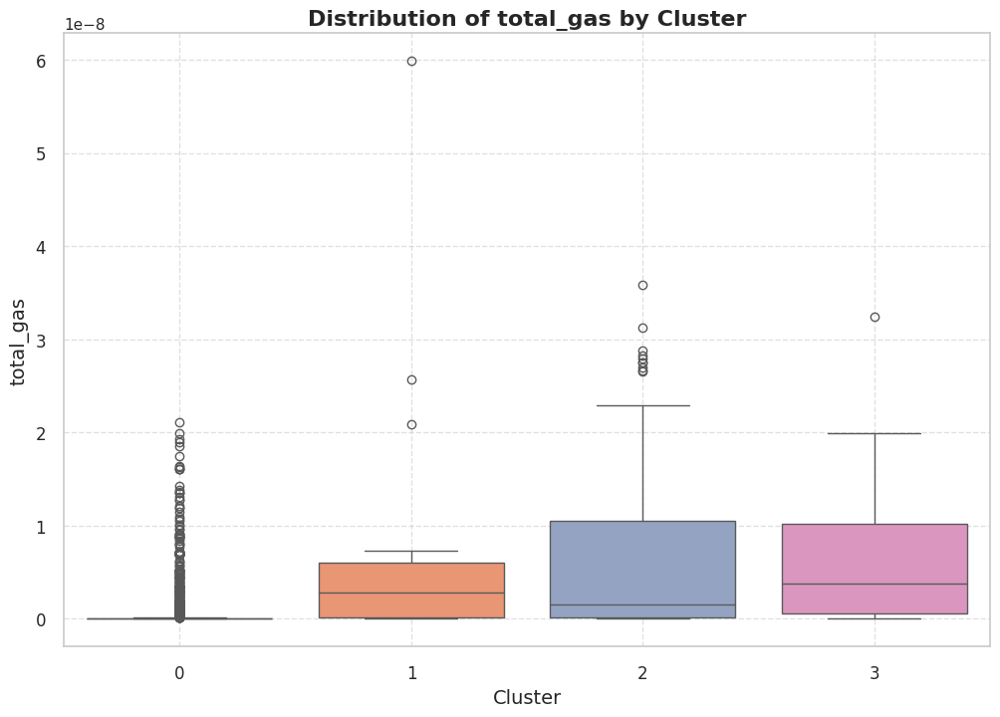

<ipython-input-66-8aa46dc679bf>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Cluster', y=feature, data=final_agg, palette=palette, showfliers=True)
<ipython-input-66-8aa46dc679bf>:7: UserWarning: The palette list has more values (8) than needed (4), which may not be intended.
  sns.boxplot(x='Cluster', y=feature, data=final_agg, palette=palette, showfliers=True)


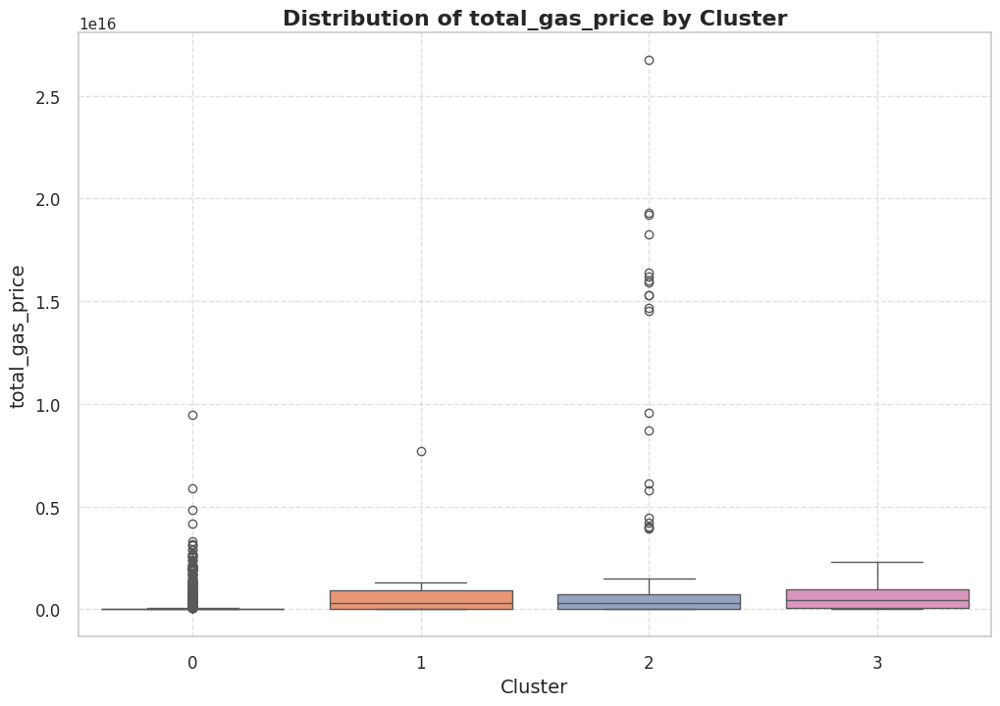

<ipython-input-66-8aa46dc679bf>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Cluster', y=feature, data=final_agg, palette=palette, showfliers=True)
<ipython-input-66-8aa46dc679bf>:7: UserWarning: The palette list has more values (8) than needed (4), which may not be intended.
  sns.boxplot(x='Cluster', y=feature, data=final_agg, palette=palette, showfliers=True)


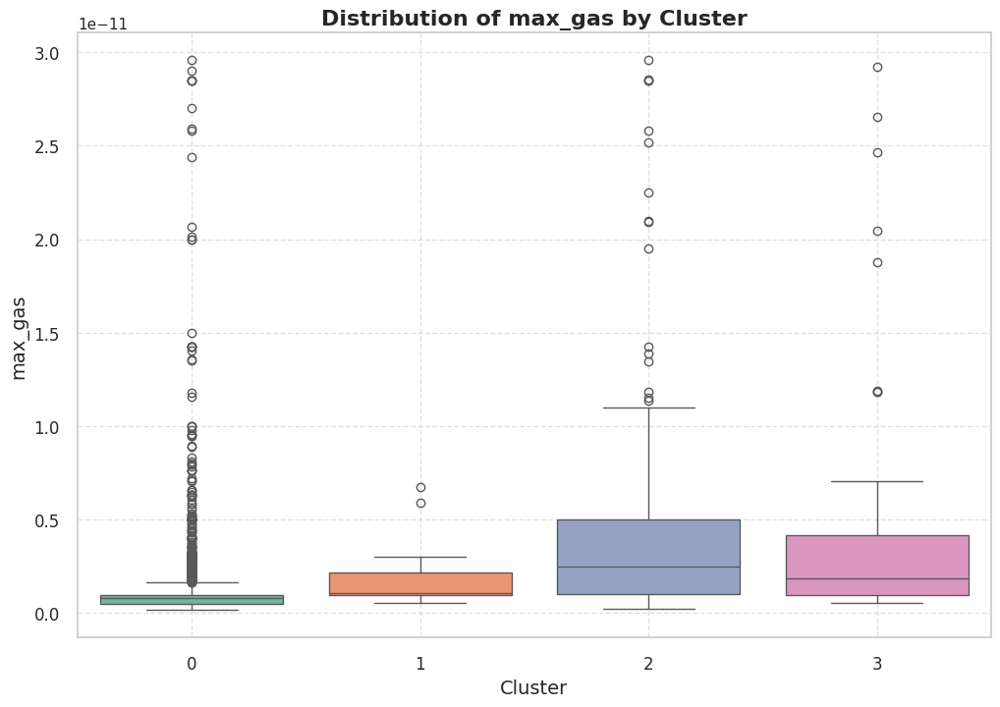

<ipython-input-66-8aa46dc679bf>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Cluster', y=feature, data=final_agg, palette=palette, showfliers=True)
<ipython-input-66-8aa46dc679bf>:7: UserWarning: The palette list has more values (8) than needed (4), which may not be intended.
  sns.boxplot(x='Cluster', y=feature, data=final_agg, palette=palette, showfliers=True)


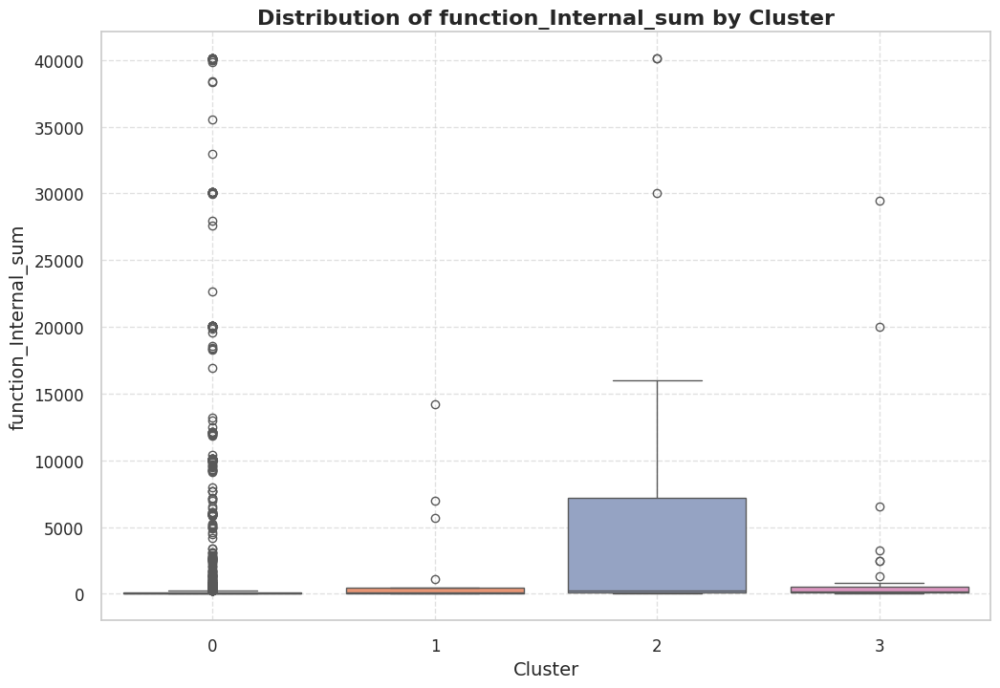

<ipython-input-66-8aa46dc679bf>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Cluster', y=feature, data=final_agg, palette=palette, showfliers=True)
<ipython-input-66-8aa46dc679bf>:7: UserWarning: The palette list has more values (8) than needed (4), which may not be intended.
  sns.boxplot(x='Cluster', y=feature, data=final_agg, palette=palette, showfliers=True)


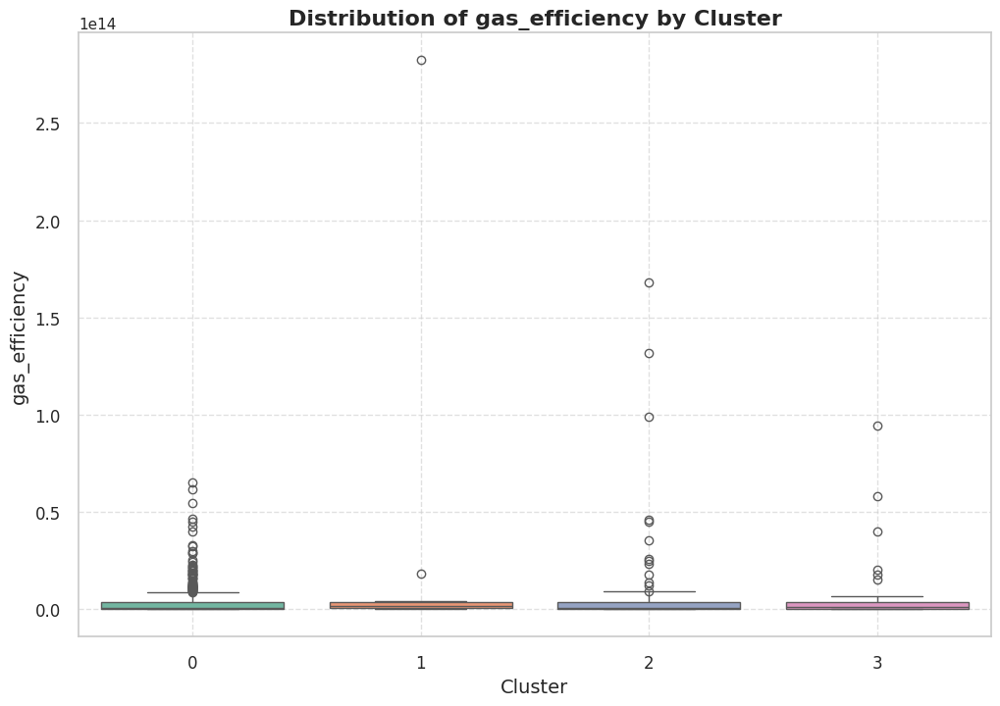

<ipython-input-66-8aa46dc679bf>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Cluster', y=feature, data=final_agg, palette=palette, showfliers=True)
<ipython-input-66-8aa46dc679bf>:7: UserWarning: The palette list has more values (8) than needed (4), which may not be intended.
  sns.boxplot(x='Cluster', y=feature, data=final_agg, palette=palette, showfliers=True)


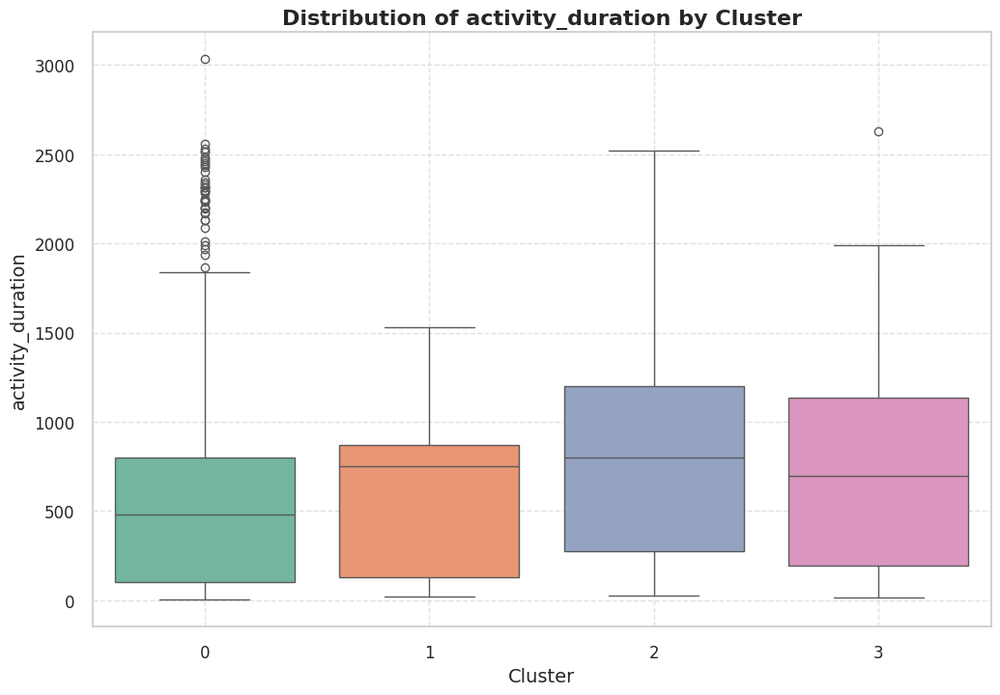

<ipython-input-66-8aa46dc679bf>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Cluster', y=feature, data=final_agg, palette=palette, showfliers=True)
<ipython-input-66-8aa46dc679bf>:7: UserWarning: The palette list has more values (8) than needed (4), which may not be intended.
  sns.boxplot(x='Cluster', y=feature, data=final_agg, palette=palette, showfliers=True)


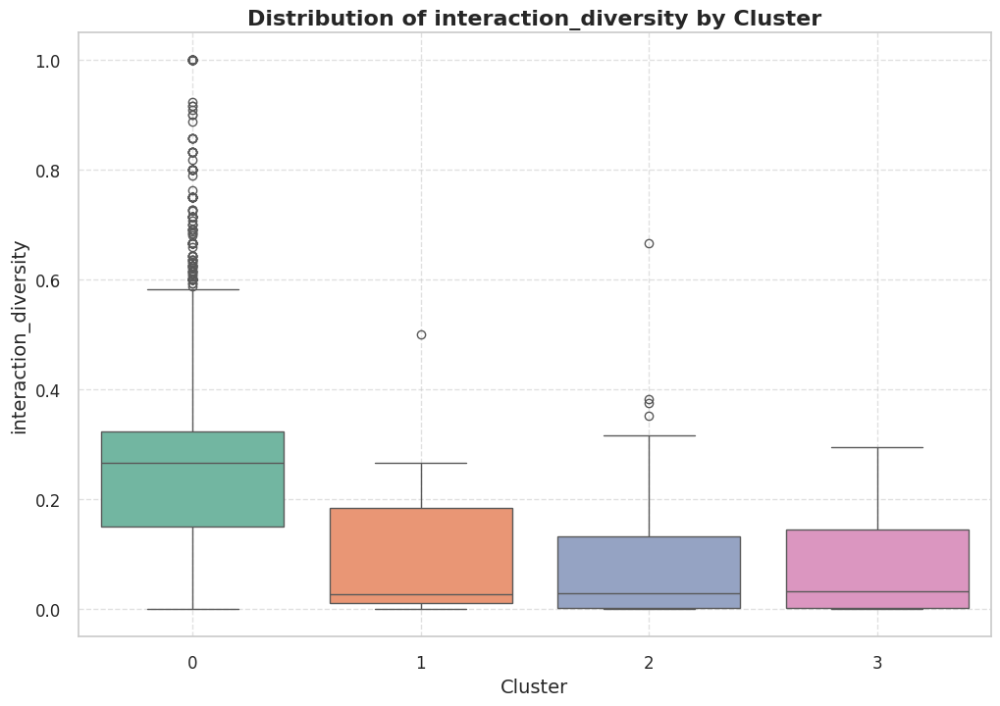

<ipython-input-66-8aa46dc679bf>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Cluster', y=feature, data=final_agg, palette=palette, showfliers=True)
<ipython-input-66-8aa46dc679bf>:7: UserWarning: The palette list has more values (8) than needed (4), which may not be intended.
  sns.boxplot(x='Cluster', y=feature, data=final_agg, palette=palette, showfliers=True)


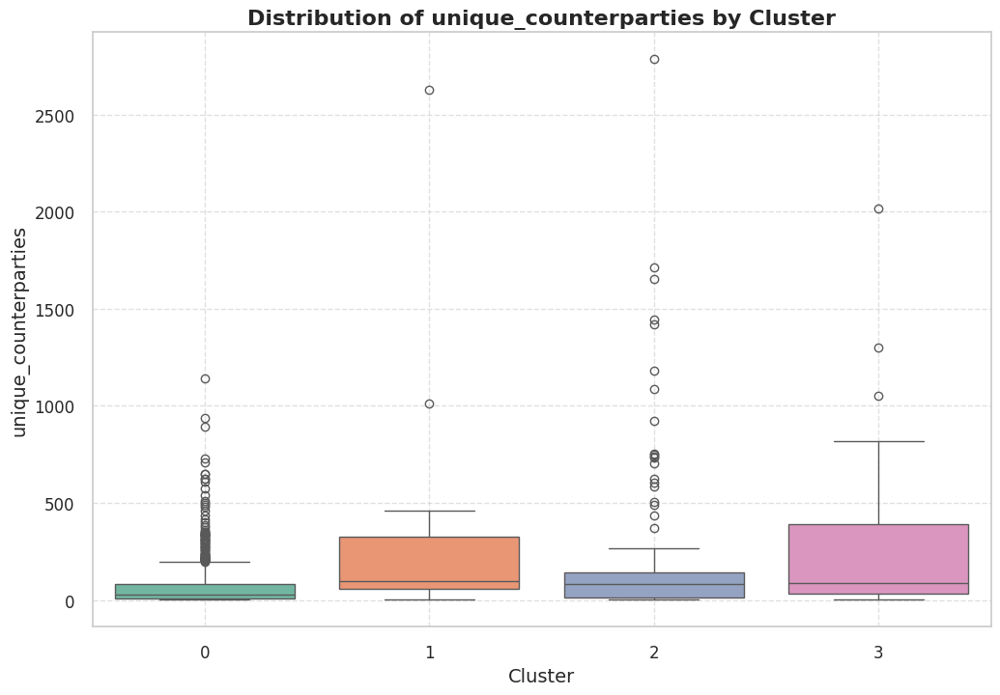

<ipython-input-66-8aa46dc679bf>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Cluster', y=feature, data=final_agg, palette=palette, showfliers=True)
<ipython-input-66-8aa46dc679bf>:7: UserWarning: The palette list has more values (8) than needed (4), which may not be intended.
  sns.boxplot(x='Cluster', y=feature, data=final_agg, palette=palette, showfliers=True)


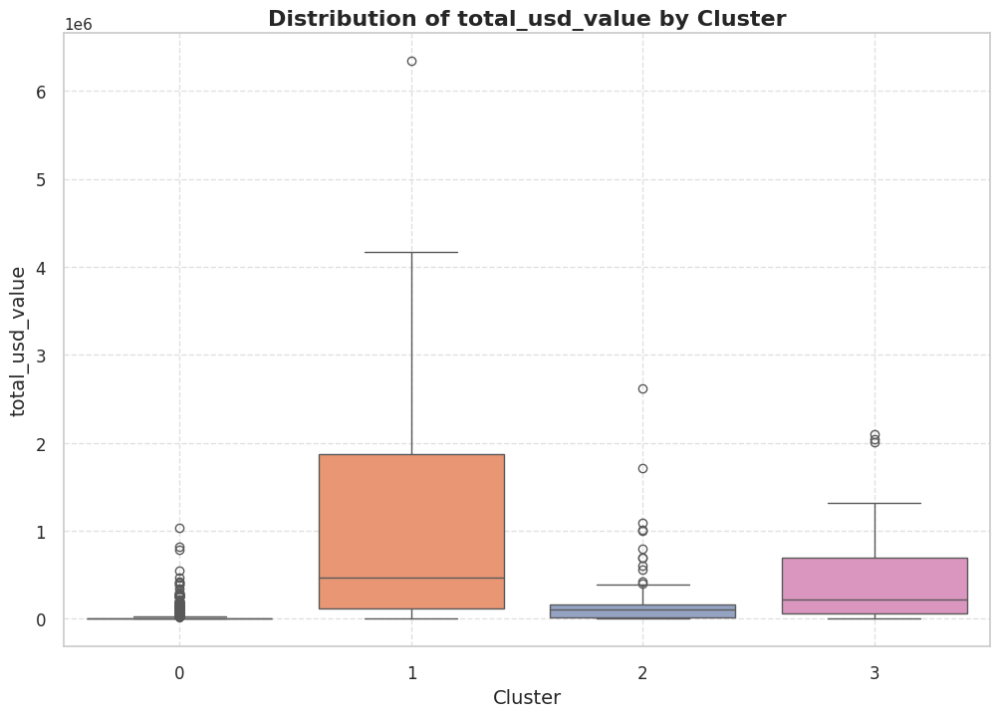

<ipython-input-66-8aa46dc679bf>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Cluster', y=feature, data=final_agg, palette=palette, showfliers=True)
<ipython-input-66-8aa46dc679bf>:7: UserWarning: The palette list has more values (8) than needed (4), which may not be intended.
  sns.boxplot(x='Cluster', y=feature, data=final_agg, palette=palette, showfliers=True)


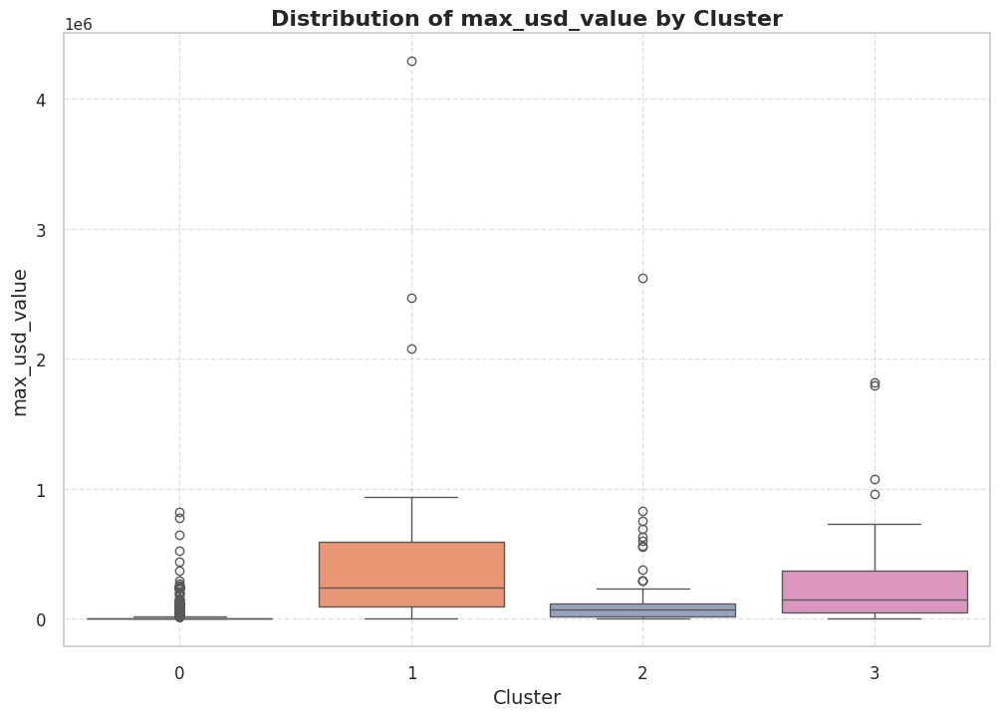

<ipython-input-66-8aa46dc679bf>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Cluster', y=feature, data=final_agg, palette=palette, showfliers=True)
<ipython-input-66-8aa46dc679bf>:7: UserWarning: The palette list has more values (8) than needed (4), which may not be intended.
  sns.boxplot(x='Cluster', y=feature, data=final_agg, palette=palette, showfliers=True)


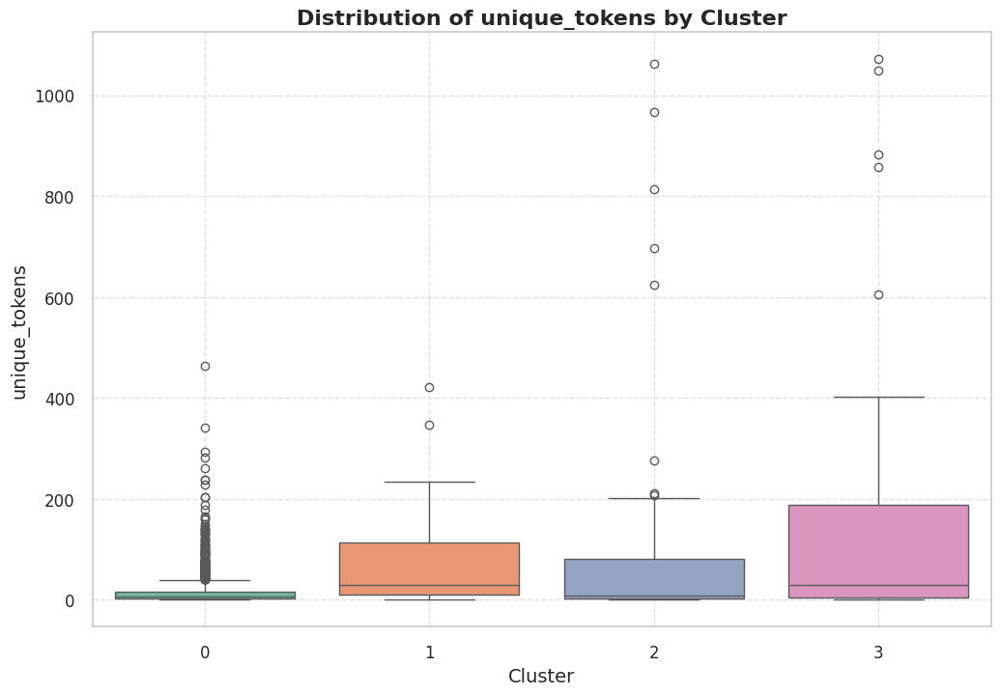

<ipython-input-66-8aa46dc679bf>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Cluster', y=feature, data=final_agg, palette=palette, showfliers=True)
<ipython-input-66-8aa46dc679bf>:7: UserWarning: The palette list has more values (8) than needed (4), which may not be intended.
  sns.boxplot(x='Cluster', y=feature, data=final_agg, palette=palette, showfliers=True)


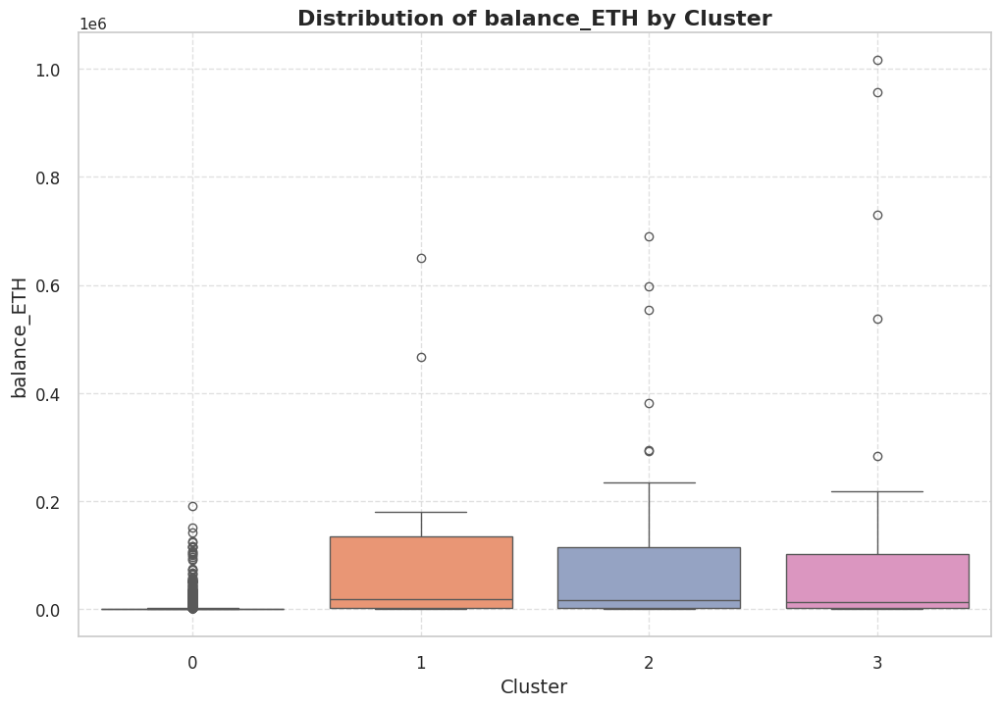

<ipython-input-66-8aa46dc679bf>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Cluster', y=feature, data=final_agg, palette=palette, showfliers=True)
<ipython-input-66-8aa46dc679bf>:7: UserWarning: The palette list has more values (8) than needed (4), which may not be intended.
  sns.boxplot(x='Cluster', y=feature, data=final_agg, palette=palette, showfliers=True)


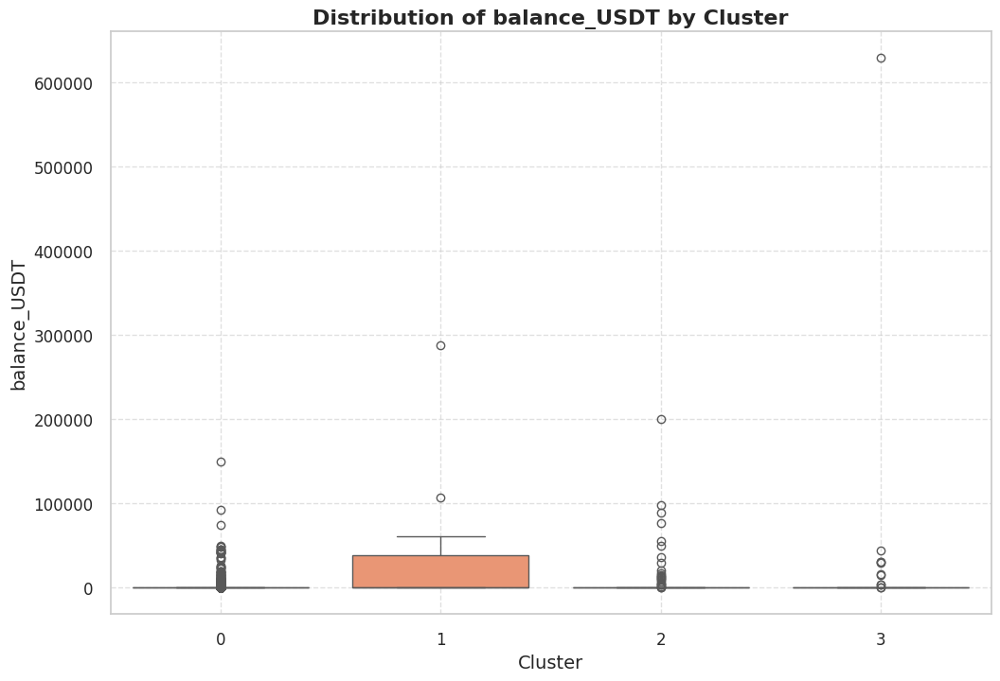

In [ ]:
sns.set(style="whitegrid")
palette = sns.color_palette("Set2")

for feature in important_features:
    plt.figure(figsize=(12, 8))
    sns.boxplot(x='Cluster', y=feature, data=final_agg, palette=palette, showfliers=True)
    plt.title(f'Distribution of {feature} by Cluster', fontsize=16, fontweight='bold')
    plt.xlabel('Cluster', fontsize=14)
    plt.ylabel(feature, fontsize=14)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.show()

In [ ]:
clusters = final_agg['Cluster'].unique()

for feature in important_features:
    print(f"\nSummary Statistics for {feature} by Cluster:\n")
    tables = []
    grouped_data = final_agg.groupby('Cluster')[feature].describe()
    for cluster in clusters:
        cluster_table = grouped_data.loc[cluster].to_frame().reset_index()
        cluster_table.columns = ['Statistic', f'Cluster {cluster}']
        tables.append(cluster_table)

    final_table = pd.concat(tables, axis=1)

    print(tabulate(final_table, headers='keys', tablefmt='fancy_grid'))


Summary Statistics for total_transactions by Cluster:

╒════╤═════════════╤═════════════╤═════════════╤═════════════╤═════════════╤═════════════╤═════════════╤═════════════╕
│    │ Statistic   │   Cluster 0 │ Statistic   │   Cluster 3 │ Statistic   │   Cluster 2 │ Statistic   │   Cluster 1 │
╞════╪═════════════╪═════════════╪═════════════╪═════════════╪═════════════╪═════════════╪═════════════╪═════════════╡
│  0 │ count       │     2239    │ count       │        44   │ count       │       105   │ count       │        16   │
├────┼─────────────┼─────────────┼─────────────┼─────────────┼─────────────┼─────────────┼─────────────┼─────────────┤
│  1 │ mean        │     1717.89 │ mean        │     14055.8 │ mean        │     12555.7 │ mean        │     12247.9 │
├────┼─────────────┼─────────────┼─────────────┼─────────────┼─────────────┼─────────────┼─────────────┼─────────────┤
│  2 │ std         │     5488.95 │ std         │     12913.9 │ std         │     14347.1 │ std         │     12

In [ ]:
# Pairwise plots for a set of important features
sns.pairplot(final_agg, vars=important_features, hue='Cluster', palette='viridis')
plt.suptitle('Pairwise Plot of Important Features by Cluster', y=1.02)
plt.show()


KeyboardInterrupt: 

In [ ]:
features = data_scaled.drop('Cluster', axis=1)
clusters = data_scaled['Cluster']

# Apply t-SNE to reduce dimensionality to 2D
tsne = TSNE(n_components=2)
tsne_results = tsne.fit_transform(features)

# Create a DataFrame with t-SNE results and cluster labels
tsne_df = pd.DataFrame(tsne_results, columns=['TSNE1', 'TSNE2'])
tsne_df['cluster'] = clusters

# Plot the t-SNE results
plt.figure(figsize=(12, 8))
sns.scatterplot(
    x='TSNE1', y='TSNE2',
    hue='cluster',
    palette=sns.color_palette('hsv', len(tsne_df['cluster'].unique())),
    data=tsne_df,
    legend='full',
    alpha=0.8
)
plt.title('t-SNE Visualization of Clusters')
plt.xlabel('TSNE1')
plt.ylabel('TSNE2')
plt.legend(title='Cluster')
plt.show()

In [ ]:
for col in important_features:
    plt.figure(figsize=(12, 8))
    sns.barplot(x='Cluster', y=col, data=final_agg, errorbar=None, palette='viridis', hue='Cluster', dodge=False, legend=False)
    plt.title(f'Distribution of {col} by Cluster')
    plt.xlabel('Cluster')
    plt.ylabel(col)
    plt.xticks(rotation=0)
    plt.show()

In [ ]:
for col in important_features:
    plt.figure(figsize=(12, 8))
    sns.violinplot(x='Cluster', y=col, data=final_agg, palette='viridis', hue='Cluster', dodge=False, legend=False)
    plt.title(f'Distribution of {col} by Cluster')
    plt.xlabel('Cluster')
    plt.ylabel(col)
    plt.xticks(rotation=0)
    plt.show()

In [ ]:
corr = final_agg[important_features + ['Cluster']].corr(method='spearman')

# Plot the heatmap
plt.figure(figsize=(18, 15))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title("Spearman Correlation Heatmap")
plt.show()

In [ ]:
# Compute correlation matrix
corr_df = pd.DataFrame(corr)
print(tabulate(corr_df, headers='keys', tablefmt='pretty', floatfmt='.3f'))

In [ ]:
clusters = final_agg['Cluster']
columns_to_analyze = [
    'total_transactions', 'total_value', 'avg_value', 'median_value',
    'max_value', 'failed_transactions',
    'total_gas', 'avg_gas', 'min_gas', 'max_gas', 'total_gas_price',
    'contract_interactions', 'function_Internal_sum', 'function_approve(address _spender, uint256 _value)_sum',
    'function_transfer(address _to, uint256 _value)_sum', 'activity_duration',
    'recency', 'transaction_frequency', 'gas_efficiency', 'unique_contract_interactions',
    'unique_counterparties', 'interaction_diversity', 'total_usd_value',
    'avg_usd_value', 'min_usd_value', 'max_usd_value', 'unique_tokens',
    'balance_ETH', 'balance_USDC', 'balance_DAI'
]

# Kruskal-Wallis test for continuous variables
kw_results = {}
for column in columns_to_analyze:
    stat, p = stats.kruskal(*[final_agg[column][clusters == cluster] for cluster in set(clusters)])
    kw_results[column] = p

print("Kruskal-Wallis Test Results:")
for column, p in kw_results.items():
    if p < 0.05:
        print(f"{column}: p-value = {p}")

In [ ]:
# Find the columns with the lowest 10 p-values
lowest_p_values = sorted(kw_results.items(), key=lambda item: item[1])[:10]
lowest_p_columns = [item[0] for item in lowest_p_values]
print("Columns with the lowest 10 p-values:", lowest_p_columns)

In [ ]:
# Calculate descriptive statistics for selected columns in each cluster
descriptive_stats = final_agg.groupby('Cluster')[lowest_p_columns].agg(['mean', 'median', 'std'])
print(tabulate(descriptive_stats.reset_index(), headers='keys', tablefmt='pretty'))

In [ ]:
from statsmodels.stats.multicomp import pairwise_tukeyhsd

for column in lowest_p_columns:
    tukey = pairwise_tukeyhsd(endog=final_agg[column], groups=final_agg['Cluster'], alpha=0.05)
    print(tukey)